<a href="https://colab.research.google.com/github/vkorennoy/Advanced_ml/blob/main/HW_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Часть I. Pix2pix

### Собираем данные

In [2]:
!wget http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/facades.tar.gz

--2021-12-27 21:16:55--  http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/facades.tar.gz
Resolving efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)... 128.32.244.190
Connecting to efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)|128.32.244.190|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30168306 (29M) [application/x-gzip]
Saving to: ‘facades.tar.gz.1’

facades.tar.gz.1    100%[===================>]  28.77M  2.74MB/s    in 12s     

2021-12-27 21:17:08 (2.32 MB/s) - ‘facades.tar.gz.1’ saved [30168306/30168306]



In [3]:
!tar -xvf facades.tar.gz

facades/
facades/test/
facades/test/27.jpg
facades/test/5.jpg
facades/test/72.jpg
facades/test/1.jpg
facades/test/10.jpg
facades/test/100.jpg
facades/test/101.jpg
facades/test/102.jpg
facades/test/103.jpg
facades/test/104.jpg
facades/test/105.jpg
facades/test/106.jpg
facades/test/11.jpg
facades/test/12.jpg
facades/test/13.jpg
facades/test/14.jpg
facades/test/15.jpg
facades/test/16.jpg
facades/test/17.jpg
facades/test/18.jpg
facades/test/19.jpg
facades/test/2.jpg
facades/test/20.jpg
facades/test/21.jpg
facades/test/22.jpg
facades/test/23.jpg
facades/test/24.jpg
facades/test/25.jpg
facades/test/26.jpg
facades/test/50.jpg
facades/test/51.jpg
facades/test/52.jpg
facades/test/53.jpg
facades/test/54.jpg
facades/test/55.jpg
facades/test/56.jpg
facades/test/57.jpg
facades/test/58.jpg
facades/test/59.jpg
facades/test/6.jpg
facades/test/60.jpg
facades/test/61.jpg
facades/test/62.jpg
facades/test/63.jpg
facades/test/64.jpg
facades/test/65.jpg
facades/test/66.jpg
facades/test/67.jpg
facades/test/6

In [4]:
import os
from glob import glob
from pathlib import Path

import itertools
import matplotlib.pyplot as plt
import torch
from PIL import Image
import numpy as np
from torch import nn
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from torchvision.transforms.functional import center_crop
from torchvision.utils import make_grid
from tqdm.auto import tqdm

In [5]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [6]:
device

device(type='cuda')

In [7]:
path = "./facades/train/"


class FacadesDataset(Dataset):
    def __init__(self, path, target_size=256, device=device):
        self.filenames = glob(str(Path(path) / "*"))
        self.target_size = target_size
        self.device = device

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        filename = self.filenames[idx]
        image = Image.open(filename)
        image = transforms.functional.to_tensor(image)
        image_width = image.shape[2]

        real = image[:, :, : image_width // 2].to(self.device)
        condition = image[:, :, image_width // 2 :].to(self.device)

        target_size = self.target_size
        if target_size:
            condition = nn.functional.interpolate(condition, size=target_size)
            real = nn.functional.interpolate(real, size=target_size)

        return real, condition

In [8]:
batch_size = 4

In [9]:
dataset = FacadesDataset(path)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

### Создаем модель. Отдельно создадим классы генератора и дискриминатора

In [10]:
class Generator(nn.Module):
    def __init__(self, in_channels=3, out_channels=3, kernel=4, strides=2, padding=1):
        super().__init__()

        self.encoders = [
                         nn.Sequential(
                            nn.Conv2d(in_channels, 64, kernel, strides, padding),
                            nn.LeakyReLU(0.2),
                         ), 
                         nn.Sequential(
                             nn.Conv2d(64, 128, kernel, strides, padding),
                             nn.BatchNorm2d(128),
                             nn.LeakyReLU(0.2),
                         ), 
                         nn.Sequential(
                             nn.Conv2d(128, 256, kernel, strides, padding),
                             nn.BatchNorm2d(256),
                             nn.LeakyReLU(0.2),
                         ), 
                         nn.Sequential(
                             nn.Conv2d(256, 512, kernel, strides, padding),
                             nn.BatchNorm2d(512),
                             nn.LeakyReLU(0.2),
                         ), 
        ]

        self.decoders = [
                        nn.Sequential(
                            nn.ConvTranspose2d(512, 256, kernel, strides, padding),
                            nn.BatchNorm2d(256),
                            nn.Dropout2d(0.5),
                            nn.ReLU(),
                        ),
                        nn.Sequential(
                            nn.ConvTranspose2d(512, 128, kernel, strides, padding),
                            nn.BatchNorm2d(128),
                            nn.Dropout2d(0.5),
                            nn.ReLU(),
                        ),
                        nn.Sequential(
                            nn.ConvTranspose2d(256, 64, kernel, strides, padding),
                            nn.BatchNorm2d(64),
                            nn.Dropout2d(0.5),
                            nn.ReLU(),
                        ),
                        nn.Sequential(
                            nn.ConvTranspose2d(128, out_channels, kernel, strides, padding),
                            nn.ReLU(),
                        )
        ]

        self.encoders = nn.ModuleList(self.encoders)
        self.decoders = nn.ModuleList(self.decoders)

        self.tanh = nn.Tanh()

    def forward(self, x):
        enc_x = []
        for enc in self.encoders:
            x = enc(x)
            enc_x.append(x)
        
        dec_x = self.decoders[0](enc_x.pop())

        for dec, x in zip(self.decoders[1:], enc_x[::-1]):
            dec_x = dec(torch.cat((x, dec_x), axis=1))
            
        return self.tanh(dec_x)

In [11]:
class Discriminator(nn.Module):
    def __init__(self, input_channels=6, out_channels=512, kernel=4, strides=2, padding=1):
        super().__init__()
        self.discriminator = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel, strides, padding),
            nn.Dropout2d(0.5),
            nn.ReLU(),
            
            nn.Conv2d(64, 128, kernel, strides, padding),
            nn.BatchNorm2d(128),
            nn.Dropout2d(0.5),
            nn.ReLU(),
            
            nn.Conv2d(128, 256, kernel, strides, padding),
            nn.BatchNorm2d(256),
            nn.Dropout2d(0.5),
            nn.ReLU(),
            
            nn.Conv2d(256, out_channels, kernel, strides, padding),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
            
            nn.Conv2d(out_channels, 1, kernel_size=1),
        )

    def forward(self, x, y):
        x_y = torch.cat([x, y], axis=1)
        return self.discriminator(x_y)

In [12]:
class Pix2Pix(nn.Module):
    def __init__(self, in_channels=3, out_channels=3, lr=0.0002, beta1=0.5, beta2=0.999, lambda_gp=200, display_step=1000):
        super().__init__()

        self.display_step = display_step
        self.generator = Generator(in_channels, out_channels)
        self.discriminator = Discriminator(in_channels + out_channels)
        self.lambda_gp = lambda_gp

        self.gen_optimizer = torch.optim.Adam(self.generator.parameters(), lr=lr, betas=(beta1, beta2))
        self.disc_optimizer = torch.optim.Adam(self.discriminator.parameters(), lr=lr, betas=(beta1, beta2))

        self.criterionGAN = nn.BCEWithLogitsLoss()
        self.criterionL1 = nn.L1Loss()
        self.num_iters = 0

    def backward_gen(self, real_images, conditioned_images):
        fake_images = self.generator(conditioned_images)
        disc_logits = self.discriminator(fake_images, conditioned_images)
        gan_loss = self.criterionGAN(disc_logits, torch.ones_like(disc_logits))
        L1_loss = self.criterionL1(fake_images, real_images) * self.lambda_gp
        generator_loss = gan_loss + L1_loss
        generator_loss.backward()
        return generator_loss

    def backward_disc(self, real_images, conditioned_images):
        fake_images = self.generator(conditioned_images).detach()
        fake_logits = self.discriminator(fake_images, conditioned_images)
        real_logits = self.discriminator(real_images, conditioned_images)

        fake_loss = self.criterionGAN(fake_logits, torch.zeros_like(fake_logits))
        real_loss = self.criterionGAN(real_logits, torch.ones_like(real_logits))
        discriminator_loss = (fake_loss + real_loss) / 2
        discriminator_loss.backward()
        return discriminator_loss

    def train_step(self, batch):
        real, condition = batch

        # discriminator step
        self.disc_optimizer.zero_grad()
        discriminator_loss = self.backward_disc(real, condition)
        self.disc_optimizer.step()

        # generator step
        self.gen_optimizer.zero_grad()
        generator_loss = self.backward_gen(real, condition)
        self.gen_optimizer.step()

        self.num_iters += 1
        if self.num_iters % self.display_step == 0:
            fake = self.generator(condition).detach()
            display_progress(condition[0], fake[0], real[0])
        
        return discriminator_loss, generator_loss

In [13]:
def display_progress(cond, fake, real, figsize=(10, 5)):
    cond = cond.detach().cpu().permute(1, 2, 0)
    fake = fake.detach().cpu().permute(1, 2, 0)
    real = real.detach().cpu().permute(1, 2, 0)

    fig, ax = plt.subplots(1, 3, figsize=figsize)
    ax[0].imshow(cond)
    ax[2].imshow(fake)
    ax[1].imshow(real)
    plt.show()

In [14]:
def plot_losses(d_losses, g_losses):
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111)

    n_epochs = len(d_losses) - 1
    x_train = np.linspace(0, n_epochs, len(d_losses))
    x_test = np.arange(n_epochs + 1)

    ax.plot(x_train, d_losses, label='Ошибка дискриминатора')
    ax.plot(x_test, g_losses, label='Ошибка генератора')
    ax.legend()
    plt.xlabel('Эпоха обучения')
    plt.ylabel('Ошибка')

### Обучим модель на простых условных ганах (Conditional GANs)

In [15]:
model = Pix2Pix().to(device)

In [16]:
def train(dataloader=dataloader, model=model, num_epochs=20, check_every=50):
    d_losses, g_losses = [], []
    for epoch in range(num_epochs):
        for i, imgs in enumerate(dataloader):
            d_loss, g_loss = model.train_step(imgs)
            if d_loss is not None and g_loss is not None:
                d_losses.append(d_loss.item())
                g_losses.append(g_loss.item())
            batches_done = epoch * len(dataloader) + i
            if batches_done % check_every == 0:
                print("\t...epoch %d/%d\tbatch %d/%d\tD loss: %.6f\tG loss: %.6f" % \
                      (epoch, num_epochs, i, len(dataloader), d_losses[-1], g_losses[-1]))
    return d_losses, g_losses

	...epoch 0/10	batch 0/100	D loss: 0.714840	G loss: 80.498749
	...epoch 0/10	batch 50/100	D loss: 0.706472	G loss: 56.080299
	...epoch 1/10	batch 0/100	D loss: 0.683941	G loss: 51.596462
	...epoch 1/10	batch 50/100	D loss: 0.583830	G loss: 44.990402
	...epoch 2/10	batch 0/100	D loss: 0.679603	G loss: 42.033039
	...epoch 2/10	batch 50/100	D loss: 0.560841	G loss: 36.257961
	...epoch 3/10	batch 0/100	D loss: 0.399706	G loss: 44.603127
	...epoch 3/10	batch 50/100	D loss: 0.470680	G loss: 38.452629
	...epoch 4/10	batch 0/100	D loss: 0.451697	G loss: 42.300156
	...epoch 4/10	batch 50/100	D loss: 0.202361	G loss: 41.674721
	...epoch 5/10	batch 0/100	D loss: 0.342735	G loss: 38.219734
	...epoch 5/10	batch 50/100	D loss: 0.156511	G loss: 39.664524
	...epoch 6/10	batch 0/100	D loss: 0.236688	G loss: 45.624039
	...epoch 6/10	batch 50/100	D loss: 0.292524	G loss: 43.189037
	...epoch 7/10	batch 0/100	D loss: 0.093236	G loss: 44.900517
	...epoch 7/10	batch 50/100	D loss: 0.314745	G loss: 36.087406


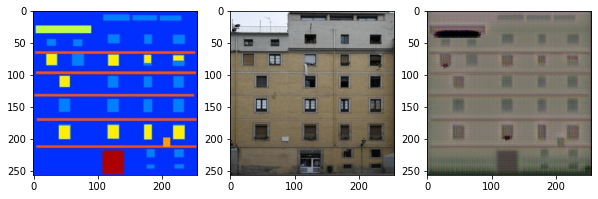

In [17]:
d_losses, g_losses = train(num_epochs=10)

	...epoch 0/200	batch 0/100	D loss: 0.080650	G loss: 42.021706
	...epoch 0/200	batch 50/100	D loss: 0.039921	G loss: 39.104481
	...epoch 1/200	batch 0/100	D loss: 0.044220	G loss: 35.907413
	...epoch 1/200	batch 50/100	D loss: 0.045106	G loss: 43.594292
	...epoch 2/200	batch 0/100	D loss: 0.108897	G loss: 34.436813
	...epoch 2/200	batch 50/100	D loss: 0.025151	G loss: 46.090813
	...epoch 3/200	batch 0/100	D loss: 0.040674	G loss: 44.672085
	...epoch 3/200	batch 50/100	D loss: 0.258003	G loss: 40.585529
	...epoch 4/200	batch 0/100	D loss: 0.187663	G loss: 44.187286
	...epoch 4/200	batch 50/100	D loss: 0.035985	G loss: 39.333729
	...epoch 5/200	batch 0/100	D loss: 0.112253	G loss: 44.325653
	...epoch 5/200	batch 50/100	D loss: 0.177494	G loss: 35.805275
	...epoch 6/200	batch 0/100	D loss: 0.116489	G loss: 39.549789
	...epoch 6/200	batch 50/100	D loss: 0.018044	G loss: 39.122292
	...epoch 7/200	batch 0/100	D loss: 0.345376	G loss: 41.065189
	...epoch 7/200	batch 50/100	D loss: 0.266669	G 

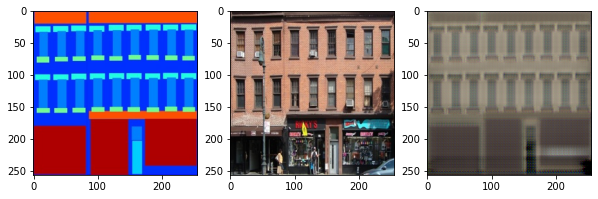

	...epoch 10/200	batch 0/100	D loss: 0.032499	G loss: 39.904808
	...epoch 10/200	batch 50/100	D loss: 0.017567	G loss: 38.671303
	...epoch 11/200	batch 0/100	D loss: 0.102479	G loss: 35.363342
	...epoch 11/200	batch 50/100	D loss: 0.206358	G loss: 35.583920
	...epoch 12/200	batch 0/100	D loss: 0.030365	G loss: 40.708565
	...epoch 12/200	batch 50/100	D loss: 0.102063	G loss: 38.146484
	...epoch 13/200	batch 0/100	D loss: 0.275379	G loss: 42.756729
	...epoch 13/200	batch 50/100	D loss: 0.073152	G loss: 46.273731
	...epoch 14/200	batch 0/100	D loss: 0.092887	G loss: 41.131390
	...epoch 14/200	batch 50/100	D loss: 0.033962	G loss: 43.458389
	...epoch 15/200	batch 0/100	D loss: 0.027277	G loss: 40.155853
	...epoch 15/200	batch 50/100	D loss: 0.028700	G loss: 39.882576
	...epoch 16/200	batch 0/100	D loss: 0.269553	G loss: 38.612125
	...epoch 16/200	batch 50/100	D loss: 0.773269	G loss: 36.035812
	...epoch 17/200	batch 0/100	D loss: 0.101478	G loss: 38.227539
	...epoch 17/200	batch 50/100	D l

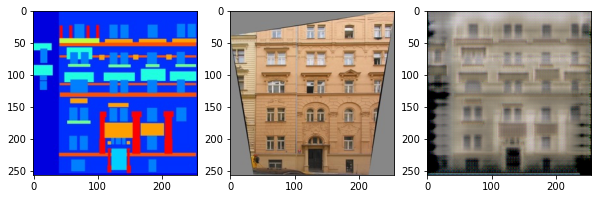

	...epoch 20/200	batch 0/100	D loss: 0.100496	G loss: 37.486076
	...epoch 20/200	batch 50/100	D loss: 0.062005	G loss: 42.399834
	...epoch 21/200	batch 0/100	D loss: 0.064685	G loss: 39.371391
	...epoch 21/200	batch 50/100	D loss: 0.130313	G loss: 45.642548
	...epoch 22/200	batch 0/100	D loss: 0.101819	G loss: 37.048004
	...epoch 22/200	batch 50/100	D loss: 0.686249	G loss: 38.629288
	...epoch 23/200	batch 0/100	D loss: 0.261062	G loss: 37.286015
	...epoch 23/200	batch 50/100	D loss: 0.036828	G loss: 40.823200
	...epoch 24/200	batch 0/100	D loss: 0.273841	G loss: 38.858742
	...epoch 24/200	batch 50/100	D loss: 0.136009	G loss: 34.516796
	...epoch 25/200	batch 0/100	D loss: 0.149474	G loss: 43.035000
	...epoch 25/200	batch 50/100	D loss: 0.217698	G loss: 44.701744
	...epoch 26/200	batch 0/100	D loss: 0.125890	G loss: 39.525303
	...epoch 26/200	batch 50/100	D loss: 0.043449	G loss: 37.805016
	...epoch 27/200	batch 0/100	D loss: 0.037502	G loss: 36.524364
	...epoch 27/200	batch 50/100	D l

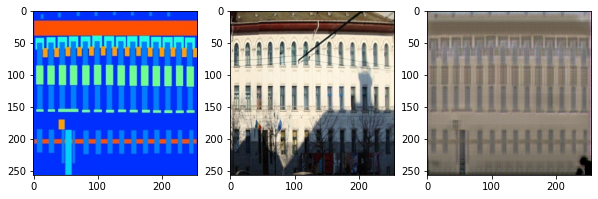

	...epoch 30/200	batch 0/100	D loss: 0.046699	G loss: 37.078640
	...epoch 30/200	batch 50/100	D loss: 0.077055	G loss: 33.544113
	...epoch 31/200	batch 0/100	D loss: 0.112615	G loss: 38.948666
	...epoch 31/200	batch 50/100	D loss: 0.049260	G loss: 36.486958
	...epoch 32/200	batch 0/100	D loss: 0.038898	G loss: 43.501976
	...epoch 32/200	batch 50/100	D loss: 0.161308	G loss: 36.000492
	...epoch 33/200	batch 0/100	D loss: 0.098954	G loss: 38.981987
	...epoch 33/200	batch 50/100	D loss: 0.035620	G loss: 40.255409
	...epoch 34/200	batch 0/100	D loss: 0.065376	G loss: 34.321499
	...epoch 34/200	batch 50/100	D loss: 0.054704	G loss: 37.706043
	...epoch 35/200	batch 0/100	D loss: 0.127143	G loss: 39.728333
	...epoch 35/200	batch 50/100	D loss: 0.039956	G loss: 36.916470
	...epoch 36/200	batch 0/100	D loss: 0.008397	G loss: 40.634998
	...epoch 36/200	batch 50/100	D loss: 0.029142	G loss: 35.950344
	...epoch 37/200	batch 0/100	D loss: 0.905033	G loss: 39.005535
	...epoch 37/200	batch 50/100	D l

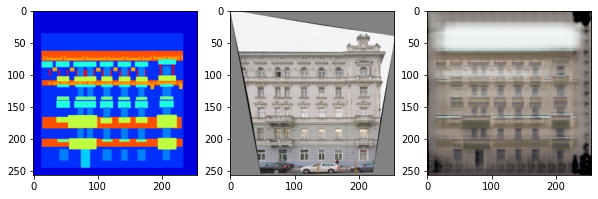

	...epoch 40/200	batch 0/100	D loss: 0.016146	G loss: 45.753593
	...epoch 40/200	batch 50/100	D loss: 0.044646	G loss: 37.040379
	...epoch 41/200	batch 0/100	D loss: 0.166660	G loss: 35.966225
	...epoch 41/200	batch 50/100	D loss: 0.062489	G loss: 36.106087
	...epoch 42/200	batch 0/100	D loss: 0.071673	G loss: 38.708145
	...epoch 42/200	batch 50/100	D loss: 0.010901	G loss: 39.954407
	...epoch 43/200	batch 0/100	D loss: 0.024569	G loss: 39.018242
	...epoch 43/200	batch 50/100	D loss: 0.021278	G loss: 42.178699
	...epoch 44/200	batch 0/100	D loss: 0.221580	G loss: 43.048248
	...epoch 44/200	batch 50/100	D loss: 0.128946	G loss: 38.242104
	...epoch 45/200	batch 0/100	D loss: 0.022330	G loss: 42.137089
	...epoch 45/200	batch 50/100	D loss: 0.090034	G loss: 45.130672
	...epoch 46/200	batch 0/100	D loss: 0.712346	G loss: 33.112286
	...epoch 46/200	batch 50/100	D loss: 0.041182	G loss: 35.948200
	...epoch 47/200	batch 0/100	D loss: 0.067932	G loss: 34.413368
	...epoch 47/200	batch 50/100	D l

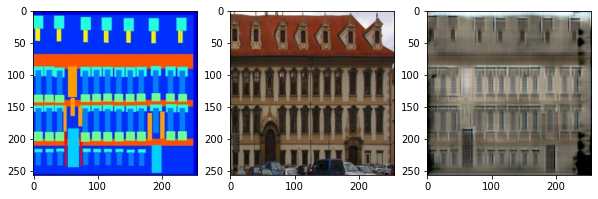

	...epoch 50/200	batch 0/100	D loss: 0.015055	G loss: 44.414135
	...epoch 50/200	batch 50/100	D loss: 0.039277	G loss: 37.575756
	...epoch 51/200	batch 0/100	D loss: 0.036030	G loss: 36.829639
	...epoch 51/200	batch 50/100	D loss: 0.183361	G loss: 34.158886
	...epoch 52/200	batch 0/100	D loss: 0.019860	G loss: 39.111393
	...epoch 52/200	batch 50/100	D loss: 0.068484	G loss: 41.014111
	...epoch 53/200	batch 0/100	D loss: 0.077415	G loss: 42.271034
	...epoch 53/200	batch 50/100	D loss: 0.007964	G loss: 35.537109
	...epoch 54/200	batch 0/100	D loss: 0.068133	G loss: 40.038128
	...epoch 54/200	batch 50/100	D loss: 0.129175	G loss: 37.021469
	...epoch 55/200	batch 0/100	D loss: 0.077888	G loss: 34.743763
	...epoch 55/200	batch 50/100	D loss: 0.026181	G loss: 36.475819
	...epoch 56/200	batch 0/100	D loss: 0.046299	G loss: 42.563805
	...epoch 56/200	batch 50/100	D loss: 0.138931	G loss: 38.938179
	...epoch 57/200	batch 0/100	D loss: 0.013447	G loss: 40.538479
	...epoch 57/200	batch 50/100	D l

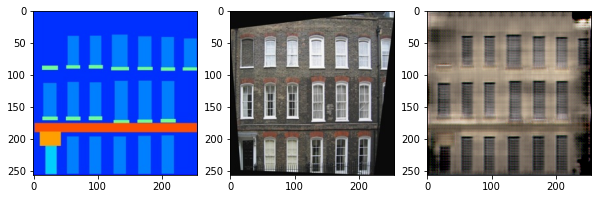

	...epoch 60/200	batch 0/100	D loss: 0.038195	G loss: 35.885078
	...epoch 60/200	batch 50/100	D loss: 0.019906	G loss: 32.529797
	...epoch 61/200	batch 0/100	D loss: 0.102156	G loss: 37.174149
	...epoch 61/200	batch 50/100	D loss: 0.014420	G loss: 34.892784
	...epoch 62/200	batch 0/100	D loss: 0.219324	G loss: 35.681103
	...epoch 62/200	batch 50/100	D loss: 0.083261	G loss: 35.989571
	...epoch 63/200	batch 0/100	D loss: 0.018802	G loss: 38.101936
	...epoch 63/200	batch 50/100	D loss: 0.059493	G loss: 38.444958
	...epoch 64/200	batch 0/100	D loss: 0.687847	G loss: 36.540398
	...epoch 64/200	batch 50/100	D loss: 0.007494	G loss: 42.675560
	...epoch 65/200	batch 0/100	D loss: 0.010120	G loss: 34.936295
	...epoch 65/200	batch 50/100	D loss: 0.022199	G loss: 38.808411
	...epoch 66/200	batch 0/100	D loss: 0.028534	G loss: 33.677784
	...epoch 66/200	batch 50/100	D loss: 0.233954	G loss: 37.889030
	...epoch 67/200	batch 0/100	D loss: 0.039509	G loss: 38.092930
	...epoch 67/200	batch 50/100	D l

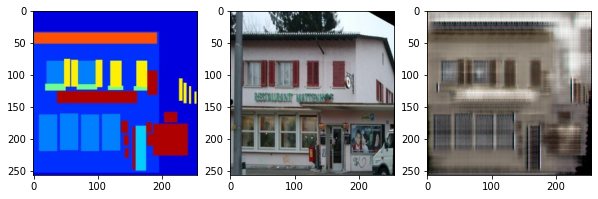

	...epoch 70/200	batch 0/100	D loss: 0.011171	G loss: 40.115242
	...epoch 70/200	batch 50/100	D loss: 0.115358	G loss: 35.798691
	...epoch 71/200	batch 0/100	D loss: 0.030965	G loss: 41.919792
	...epoch 71/200	batch 50/100	D loss: 0.004130	G loss: 39.221478
	...epoch 72/200	batch 0/100	D loss: 0.044476	G loss: 35.569675
	...epoch 72/200	batch 50/100	D loss: 0.216315	G loss: 39.955265
	...epoch 73/200	batch 0/100	D loss: 0.159504	G loss: 42.963451
	...epoch 73/200	batch 50/100	D loss: 0.051244	G loss: 31.790833
	...epoch 74/200	batch 0/100	D loss: 0.051297	G loss: 36.696095
	...epoch 74/200	batch 50/100	D loss: 0.023786	G loss: 38.169193
	...epoch 75/200	batch 0/100	D loss: 0.542620	G loss: 43.487053
	...epoch 75/200	batch 50/100	D loss: 0.015301	G loss: 41.631878
	...epoch 76/200	batch 0/100	D loss: 0.010391	G loss: 44.647549
	...epoch 76/200	batch 50/100	D loss: 0.025410	G loss: 39.034245
	...epoch 77/200	batch 0/100	D loss: 0.442122	G loss: 37.923359
	...epoch 77/200	batch 50/100	D l

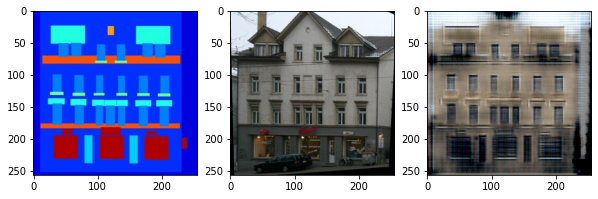

	...epoch 80/200	batch 0/100	D loss: 0.083373	G loss: 31.105070
	...epoch 80/200	batch 50/100	D loss: 0.094432	G loss: 41.778282
	...epoch 81/200	batch 0/100	D loss: 0.039407	G loss: 37.286068
	...epoch 81/200	batch 50/100	D loss: 0.182544	G loss: 36.385254
	...epoch 82/200	batch 0/100	D loss: 0.005783	G loss: 42.813721
	...epoch 82/200	batch 50/100	D loss: 0.007579	G loss: 34.661522
	...epoch 83/200	batch 0/100	D loss: 0.007335	G loss: 34.629921
	...epoch 83/200	batch 50/100	D loss: 0.003838	G loss: 35.904350
	...epoch 84/200	batch 0/100	D loss: 0.022269	G loss: 32.827553
	...epoch 84/200	batch 50/100	D loss: 0.073403	G loss: 34.758785
	...epoch 85/200	batch 0/100	D loss: 0.038817	G loss: 34.796459
	...epoch 85/200	batch 50/100	D loss: 0.008332	G loss: 37.538269
	...epoch 86/200	batch 0/100	D loss: 0.075716	G loss: 35.623989
	...epoch 86/200	batch 50/100	D loss: 0.122239	G loss: 31.902119
	...epoch 87/200	batch 0/100	D loss: 0.009957	G loss: 43.027885
	...epoch 87/200	batch 50/100	D l

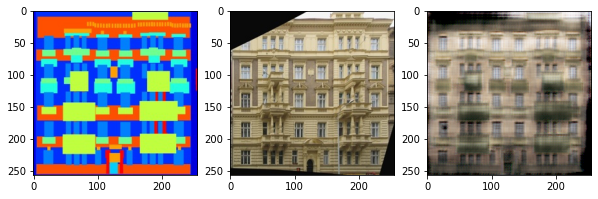

	...epoch 90/200	batch 0/100	D loss: 0.228128	G loss: 34.186089
	...epoch 90/200	batch 50/100	D loss: 0.002930	G loss: 33.119118
	...epoch 91/200	batch 0/100	D loss: 0.043745	G loss: 36.463524
	...epoch 91/200	batch 50/100	D loss: 0.005911	G loss: 35.440704
	...epoch 92/200	batch 0/100	D loss: 0.013397	G loss: 35.287270
	...epoch 92/200	batch 50/100	D loss: 0.006510	G loss: 31.600285
	...epoch 93/200	batch 0/100	D loss: 0.052637	G loss: 35.738770
	...epoch 93/200	batch 50/100	D loss: 0.006335	G loss: 31.001320
	...epoch 94/200	batch 0/100	D loss: 0.008994	G loss: 33.884331
	...epoch 94/200	batch 50/100	D loss: 0.049370	G loss: 34.219074
	...epoch 95/200	batch 0/100	D loss: 0.038655	G loss: 30.250019
	...epoch 95/200	batch 50/100	D loss: 0.095259	G loss: 37.952900
	...epoch 96/200	batch 0/100	D loss: 0.016462	G loss: 32.231808
	...epoch 96/200	batch 50/100	D loss: 0.031371	G loss: 34.322346
	...epoch 97/200	batch 0/100	D loss: 0.004436	G loss: 36.411301
	...epoch 97/200	batch 50/100	D l

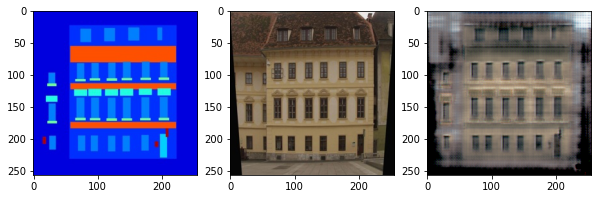

	...epoch 100/200	batch 0/100	D loss: 0.007551	G loss: 36.582615
	...epoch 100/200	batch 50/100	D loss: 0.041588	G loss: 32.969040
	...epoch 101/200	batch 0/100	D loss: 0.019699	G loss: 35.665127
	...epoch 101/200	batch 50/100	D loss: 0.202161	G loss: 32.271591
	...epoch 102/200	batch 0/100	D loss: 0.010068	G loss: 32.616043
	...epoch 102/200	batch 50/100	D loss: 0.002469	G loss: 38.371838
	...epoch 103/200	batch 0/100	D loss: 0.059890	G loss: 31.765175
	...epoch 103/200	batch 50/100	D loss: 0.075838	G loss: 31.506241
	...epoch 104/200	batch 0/100	D loss: 0.033391	G loss: 40.104687
	...epoch 104/200	batch 50/100	D loss: 0.024455	G loss: 32.876244
	...epoch 105/200	batch 0/100	D loss: 0.006623	G loss: 36.888988
	...epoch 105/200	batch 50/100	D loss: 0.050672	G loss: 34.063618
	...epoch 106/200	batch 0/100	D loss: 0.003081	G loss: 33.922211
	...epoch 106/200	batch 50/100	D loss: 0.037518	G loss: 36.167103
	...epoch 107/200	batch 0/100	D loss: 0.023758	G loss: 30.951469
	...epoch 107/200	

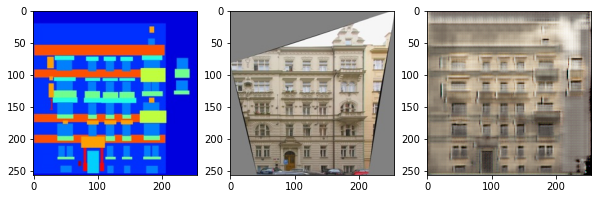

	...epoch 110/200	batch 0/100	D loss: 0.038311	G loss: 32.525494
	...epoch 110/200	batch 50/100	D loss: 0.022922	G loss: 36.937141
	...epoch 111/200	batch 0/100	D loss: 0.339859	G loss: 33.649380
	...epoch 111/200	batch 50/100	D loss: 0.264786	G loss: 36.729900
	...epoch 112/200	batch 0/100	D loss: 0.074706	G loss: 35.477417
	...epoch 112/200	batch 50/100	D loss: 0.048991	G loss: 32.442787
	...epoch 113/200	batch 0/100	D loss: 0.017406	G loss: 32.833836
	...epoch 113/200	batch 50/100	D loss: 0.004461	G loss: 32.893970
	...epoch 114/200	batch 0/100	D loss: 0.016056	G loss: 33.427479
	...epoch 114/200	batch 50/100	D loss: 0.105231	G loss: 31.351753
	...epoch 115/200	batch 0/100	D loss: 0.014163	G loss: 34.507587
	...epoch 115/200	batch 50/100	D loss: 0.208682	G loss: 32.327091
	...epoch 116/200	batch 0/100	D loss: 0.025621	G loss: 34.529625
	...epoch 116/200	batch 50/100	D loss: 0.009455	G loss: 38.081203
	...epoch 117/200	batch 0/100	D loss: 0.007988	G loss: 30.207830
	...epoch 117/200	

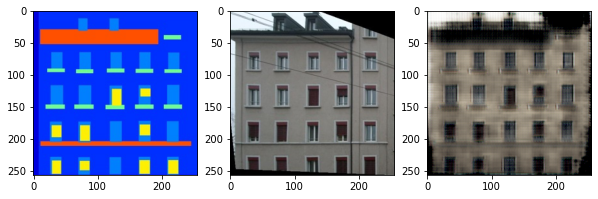

	...epoch 120/200	batch 0/100	D loss: 0.299808	G loss: 29.206627
	...epoch 120/200	batch 50/100	D loss: 0.112429	G loss: 36.279858
	...epoch 121/200	batch 0/100	D loss: 0.007539	G loss: 33.003494
	...epoch 121/200	batch 50/100	D loss: 0.004725	G loss: 34.885578
	...epoch 122/200	batch 0/100	D loss: 0.045610	G loss: 31.019932
	...epoch 122/200	batch 50/100	D loss: 0.084239	G loss: 30.766207
	...epoch 123/200	batch 0/100	D loss: 0.013907	G loss: 31.832972
	...epoch 123/200	batch 50/100	D loss: 0.028634	G loss: 31.883127
	...epoch 124/200	batch 0/100	D loss: 0.010142	G loss: 33.785019
	...epoch 124/200	batch 50/100	D loss: 0.076760	G loss: 36.753876
	...epoch 125/200	batch 0/100	D loss: 0.001362	G loss: 31.172279
	...epoch 125/200	batch 50/100	D loss: 0.236202	G loss: 31.709568
	...epoch 126/200	batch 0/100	D loss: 0.563466	G loss: 30.730921
	...epoch 126/200	batch 50/100	D loss: 0.001199	G loss: 29.147367
	...epoch 127/200	batch 0/100	D loss: 0.086813	G loss: 30.524624
	...epoch 127/200	

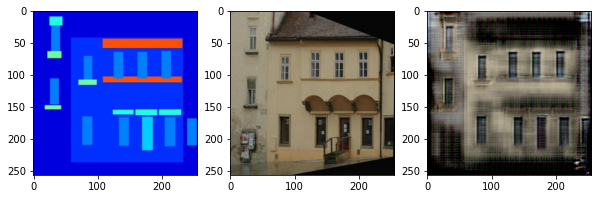

	...epoch 130/200	batch 0/100	D loss: 0.066189	G loss: 33.927303
	...epoch 130/200	batch 50/100	D loss: 0.627184	G loss: 41.951229
	...epoch 131/200	batch 0/100	D loss: 0.185655	G loss: 30.200544
	...epoch 131/200	batch 50/100	D loss: 0.189796	G loss: 36.847252
	...epoch 132/200	batch 0/100	D loss: 0.216275	G loss: 32.394886
	...epoch 132/200	batch 50/100	D loss: 0.122729	G loss: 34.776558
	...epoch 133/200	batch 0/100	D loss: 0.197892	G loss: 30.665234
	...epoch 133/200	batch 50/100	D loss: 0.634260	G loss: 34.006779
	...epoch 134/200	batch 0/100	D loss: 0.081298	G loss: 33.447258
	...epoch 134/200	batch 50/100	D loss: 0.114213	G loss: 28.171946
	...epoch 135/200	batch 0/100	D loss: 0.576960	G loss: 32.502514
	...epoch 135/200	batch 50/100	D loss: 0.081776	G loss: 36.992397
	...epoch 136/200	batch 0/100	D loss: 0.018433	G loss: 37.219288
	...epoch 136/200	batch 50/100	D loss: 0.093420	G loss: 31.976160
	...epoch 137/200	batch 0/100	D loss: 0.041042	G loss: 33.192902
	...epoch 137/200	

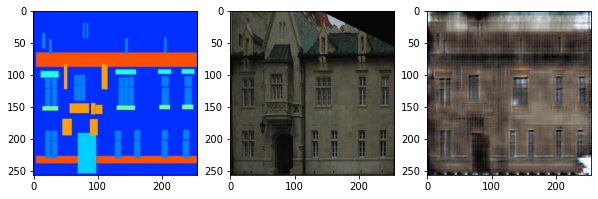

	...epoch 140/200	batch 0/100	D loss: 0.167653	G loss: 32.126457
	...epoch 140/200	batch 50/100	D loss: 0.243717	G loss: 28.360514
	...epoch 141/200	batch 0/100	D loss: 0.286280	G loss: 35.159187
	...epoch 141/200	batch 50/100	D loss: 0.022964	G loss: 33.397861
	...epoch 142/200	batch 0/100	D loss: 0.015568	G loss: 34.922218
	...epoch 142/200	batch 50/100	D loss: 0.026318	G loss: 33.165363
	...epoch 143/200	batch 0/100	D loss: 0.008450	G loss: 34.482445
	...epoch 143/200	batch 50/100	D loss: 0.016690	G loss: 33.540905
	...epoch 144/200	batch 0/100	D loss: 0.005681	G loss: 41.638100
	...epoch 144/200	batch 50/100	D loss: 0.013268	G loss: 35.164444
	...epoch 145/200	batch 0/100	D loss: 0.029492	G loss: 31.800716
	...epoch 145/200	batch 50/100	D loss: 0.055564	G loss: 36.383198
	...epoch 146/200	batch 0/100	D loss: 0.004083	G loss: 30.327232
	...epoch 146/200	batch 50/100	D loss: 0.014696	G loss: 36.766308
	...epoch 147/200	batch 0/100	D loss: 0.006496	G loss: 32.633034
	...epoch 147/200	

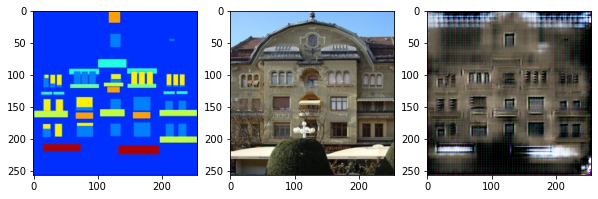

	...epoch 150/200	batch 0/100	D loss: 0.046434	G loss: 33.094807
	...epoch 150/200	batch 50/100	D loss: 0.134207	G loss: 32.740700
	...epoch 151/200	batch 0/100	D loss: 0.017735	G loss: 32.572720
	...epoch 151/200	batch 50/100	D loss: 0.019685	G loss: 28.153835
	...epoch 152/200	batch 0/100	D loss: 0.032059	G loss: 33.561459
	...epoch 152/200	batch 50/100	D loss: 0.008278	G loss: 29.600878
	...epoch 153/200	batch 0/100	D loss: 0.002297	G loss: 31.781456
	...epoch 153/200	batch 50/100	D loss: 0.166631	G loss: 31.488285
	...epoch 154/200	batch 0/100	D loss: 0.002870	G loss: 35.533981
	...epoch 154/200	batch 50/100	D loss: 0.035730	G loss: 36.488144
	...epoch 155/200	batch 0/100	D loss: 0.089857	G loss: 35.703121
	...epoch 155/200	batch 50/100	D loss: 0.003484	G loss: 35.639778
	...epoch 156/200	batch 0/100	D loss: 0.015191	G loss: 25.855703
	...epoch 156/200	batch 50/100	D loss: 0.014748	G loss: 35.491325
	...epoch 157/200	batch 0/100	D loss: 0.031648	G loss: 31.886036
	...epoch 157/200	

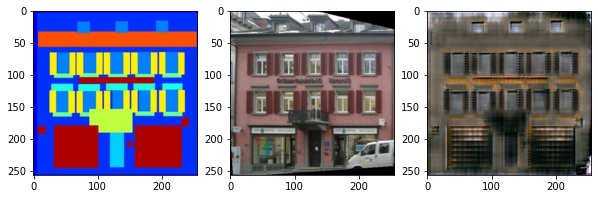

	...epoch 160/200	batch 0/100	D loss: 0.008078	G loss: 29.152693
	...epoch 160/200	batch 50/100	D loss: 0.197665	G loss: 36.162224
	...epoch 161/200	batch 0/100	D loss: 0.024908	G loss: 31.901396
	...epoch 161/200	batch 50/100	D loss: 0.003922	G loss: 28.586117
	...epoch 162/200	batch 0/100	D loss: 0.002532	G loss: 31.551506
	...epoch 162/200	batch 50/100	D loss: 0.010361	G loss: 35.649925
	...epoch 163/200	batch 0/100	D loss: 0.013743	G loss: 34.317177
	...epoch 163/200	batch 50/100	D loss: 0.006769	G loss: 35.234589
	...epoch 164/200	batch 0/100	D loss: 0.005829	G loss: 32.223305
	...epoch 164/200	batch 50/100	D loss: 0.001209	G loss: 36.245861
	...epoch 165/200	batch 0/100	D loss: 0.001539	G loss: 34.112907
	...epoch 165/200	batch 50/100	D loss: 0.002918	G loss: 31.116245
	...epoch 166/200	batch 0/100	D loss: 0.003625	G loss: 32.220039
	...epoch 166/200	batch 50/100	D loss: 0.002652	G loss: 33.871906
	...epoch 167/200	batch 0/100	D loss: 0.038894	G loss: 39.069408
	...epoch 167/200	

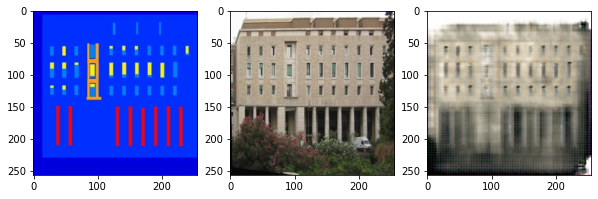

	...epoch 170/200	batch 0/100	D loss: 0.003492	G loss: 32.609146
	...epoch 170/200	batch 50/100	D loss: 0.009521	G loss: 33.398235
	...epoch 171/200	batch 0/100	D loss: 0.003206	G loss: 30.205713
	...epoch 171/200	batch 50/100	D loss: 0.003158	G loss: 30.461872
	...epoch 172/200	batch 0/100	D loss: 0.004765	G loss: 30.234344
	...epoch 172/200	batch 50/100	D loss: 0.008328	G loss: 35.492592
	...epoch 173/200	batch 0/100	D loss: 0.010650	G loss: 35.014954
	...epoch 173/200	batch 50/100	D loss: 0.002982	G loss: 34.073341
	...epoch 174/200	batch 0/100	D loss: 0.001705	G loss: 31.884109
	...epoch 174/200	batch 50/100	D loss: 0.002267	G loss: 35.012318
	...epoch 175/200	batch 0/100	D loss: 0.050281	G loss: 33.515671
	...epoch 175/200	batch 50/100	D loss: 0.003081	G loss: 35.672771
	...epoch 176/200	batch 0/100	D loss: 0.045342	G loss: 34.484509
	...epoch 176/200	batch 50/100	D loss: 0.006811	G loss: 31.018351
	...epoch 177/200	batch 0/100	D loss: 0.003244	G loss: 34.353764
	...epoch 177/200	

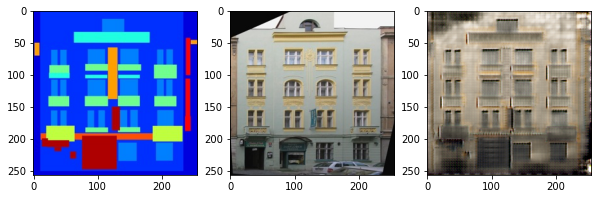

	...epoch 180/200	batch 0/100	D loss: 0.120545	G loss: 31.665081
	...epoch 180/200	batch 50/100	D loss: 0.042772	G loss: 24.224928
	...epoch 181/200	batch 0/100	D loss: 0.002301	G loss: 33.913597
	...epoch 181/200	batch 50/100	D loss: 0.035101	G loss: 30.996706
	...epoch 182/200	batch 0/100	D loss: 0.032113	G loss: 30.096716
	...epoch 182/200	batch 50/100	D loss: 0.253728	G loss: 36.431564
	...epoch 183/200	batch 0/100	D loss: 0.073449	G loss: 33.105534
	...epoch 183/200	batch 50/100	D loss: 0.011962	G loss: 39.405731
	...epoch 184/200	batch 0/100	D loss: 0.012484	G loss: 35.368015
	...epoch 184/200	batch 50/100	D loss: 0.019470	G loss: 37.942020
	...epoch 185/200	batch 0/100	D loss: 0.005575	G loss: 33.729538
	...epoch 185/200	batch 50/100	D loss: 0.127907	G loss: 31.535843
	...epoch 186/200	batch 0/100	D loss: 0.006657	G loss: 33.354389
	...epoch 186/200	batch 50/100	D loss: 0.016843	G loss: 33.958023
	...epoch 187/200	batch 0/100	D loss: 0.008044	G loss: 31.635876
	...epoch 187/200	

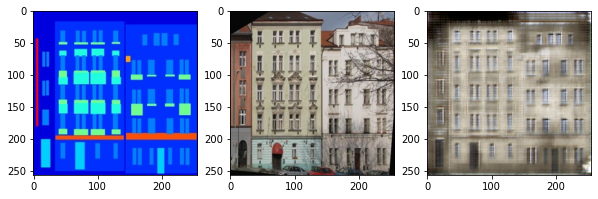

	...epoch 190/200	batch 0/100	D loss: 0.011180	G loss: 34.715408
	...epoch 190/200	batch 50/100	D loss: 0.027190	G loss: 29.916058
	...epoch 191/200	batch 0/100	D loss: 0.001836	G loss: 42.203468
	...epoch 191/200	batch 50/100	D loss: 0.001237	G loss: 29.538361
	...epoch 192/200	batch 0/100	D loss: 0.002440	G loss: 28.924730
	...epoch 192/200	batch 50/100	D loss: 0.000947	G loss: 34.435265
	...epoch 193/200	batch 0/100	D loss: 0.001402	G loss: 31.471382
	...epoch 193/200	batch 50/100	D loss: 0.001277	G loss: 33.884075
	...epoch 194/200	batch 0/100	D loss: 0.001995	G loss: 33.818562
	...epoch 194/200	batch 50/100	D loss: 0.011366	G loss: 30.771667
	...epoch 195/200	batch 0/100	D loss: 0.005209	G loss: 32.571491
	...epoch 195/200	batch 50/100	D loss: 0.000584	G loss: 35.435921
	...epoch 196/200	batch 0/100	D loss: 0.013904	G loss: 32.993355
	...epoch 196/200	batch 50/100	D loss: 0.001277	G loss: 33.734180
	...epoch 197/200	batch 0/100	D loss: 0.002473	G loss: 28.583813
	...epoch 197/200	

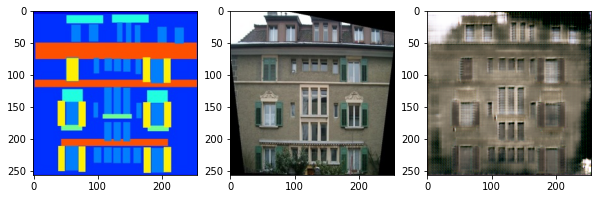

In [18]:
d_losses, g_losses = train(num_epochs=200)

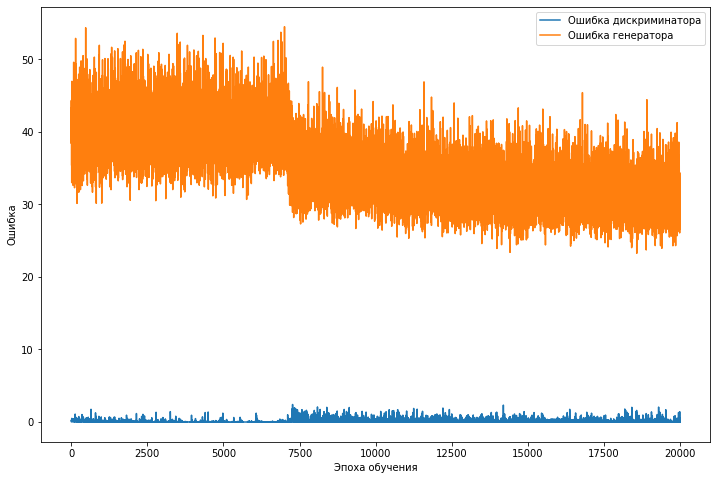

In [ ]:
plot_losses(d_losses, g_losses)

	...epoch 0/200	batch 0/100	D loss: 0.070923	G loss: 30.968390
	...epoch 0/200	batch 50/100	D loss: 0.004175	G loss: 28.740744
	...epoch 1/200	batch 0/100	D loss: 0.049026	G loss: 28.291491
	...epoch 1/200	batch 50/100	D loss: 0.078348	G loss: 33.840363
	...epoch 2/200	batch 0/100	D loss: 0.021448	G loss: 31.451147
	...epoch 2/200	batch 50/100	D loss: 0.001683	G loss: 27.953962
	...epoch 3/200	batch 0/100	D loss: 0.035419	G loss: 30.814804
	...epoch 3/200	batch 50/100	D loss: 0.034183	G loss: 28.481091
	...epoch 4/200	batch 0/100	D loss: 0.003559	G loss: 27.285540
	...epoch 4/200	batch 50/100	D loss: 0.007896	G loss: 26.119368
	...epoch 5/200	batch 0/100	D loss: 0.002852	G loss: 30.922503
	...epoch 5/200	batch 50/100	D loss: 0.038155	G loss: 33.486580
	...epoch 6/200	batch 0/100	D loss: 0.029112	G loss: 34.613838
	...epoch 6/200	batch 50/100	D loss: 0.274753	G loss: 27.863581
	...epoch 7/200	batch 0/100	D loss: 0.008123	G loss: 26.428673
	...epoch 7/200	batch 50/100	D loss: 0.003660	G 

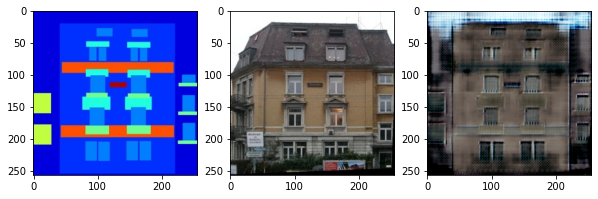

	...epoch 10/200	batch 0/100	D loss: 0.002480	G loss: 31.408974
	...epoch 10/200	batch 50/100	D loss: 0.168791	G loss: 30.000492
	...epoch 11/200	batch 0/100	D loss: 0.858533	G loss: 24.596998
	...epoch 11/200	batch 50/100	D loss: 0.416132	G loss: 27.247272
	...epoch 12/200	batch 0/100	D loss: 0.022018	G loss: 28.220451
	...epoch 12/200	batch 50/100	D loss: 0.081716	G loss: 33.728760
	...epoch 13/200	batch 0/100	D loss: 0.002547	G loss: 30.628222
	...epoch 13/200	batch 50/100	D loss: 0.039107	G loss: 30.528385
	...epoch 14/200	batch 0/100	D loss: 0.035789	G loss: 28.761135
	...epoch 14/200	batch 50/100	D loss: 1.177616	G loss: 28.604446
	...epoch 15/200	batch 0/100	D loss: 0.010786	G loss: 24.459274
	...epoch 15/200	batch 50/100	D loss: 0.054171	G loss: 32.149139
	...epoch 16/200	batch 0/100	D loss: 0.072022	G loss: 26.601690
	...epoch 16/200	batch 50/100	D loss: 0.012290	G loss: 29.712776
	...epoch 17/200	batch 0/100	D loss: 0.014105	G loss: 28.547329
	...epoch 17/200	batch 50/100	D l

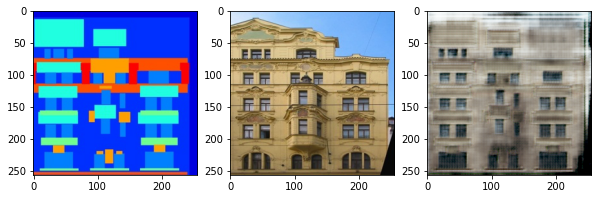

	...epoch 20/200	batch 0/100	D loss: 0.020035	G loss: 31.471344
	...epoch 20/200	batch 50/100	D loss: 0.004353	G loss: 27.996483
	...epoch 21/200	batch 0/100	D loss: 0.001740	G loss: 28.734833
	...epoch 21/200	batch 50/100	D loss: 0.009589	G loss: 30.753490
	...epoch 22/200	batch 0/100	D loss: 0.105023	G loss: 25.790791
	...epoch 22/200	batch 50/100	D loss: 0.412014	G loss: 31.246429
	...epoch 23/200	batch 0/100	D loss: 0.020461	G loss: 31.753984
	...epoch 23/200	batch 50/100	D loss: 0.022274	G loss: 32.661873
	...epoch 24/200	batch 0/100	D loss: 0.014736	G loss: 31.195501
	...epoch 24/200	batch 50/100	D loss: 0.014762	G loss: 32.516644
	...epoch 25/200	batch 0/100	D loss: 0.005249	G loss: 33.229332
	...epoch 25/200	batch 50/100	D loss: 0.012651	G loss: 30.037691
	...epoch 26/200	batch 0/100	D loss: 0.002750	G loss: 29.599089
	...epoch 26/200	batch 50/100	D loss: 0.015357	G loss: 34.676605
	...epoch 27/200	batch 0/100	D loss: 0.004176	G loss: 32.531441
	...epoch 27/200	batch 50/100	D l

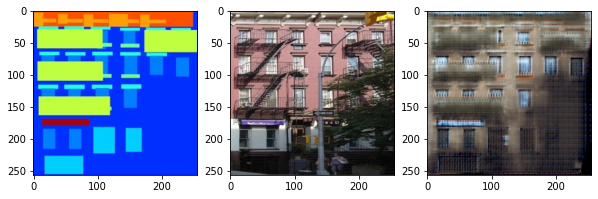

	...epoch 30/200	batch 0/100	D loss: 0.009897	G loss: 33.811703
	...epoch 30/200	batch 50/100	D loss: 0.005735	G loss: 32.488213
	...epoch 31/200	batch 0/100	D loss: 0.018139	G loss: 27.865143
	...epoch 31/200	batch 50/100	D loss: 0.046569	G loss: 28.679184
	...epoch 32/200	batch 0/100	D loss: 0.005500	G loss: 33.663025
	...epoch 32/200	batch 50/100	D loss: 0.021953	G loss: 28.249414
	...epoch 33/200	batch 0/100	D loss: 0.034410	G loss: 27.394411
	...epoch 33/200	batch 50/100	D loss: 0.014247	G loss: 35.060276
	...epoch 34/200	batch 0/100	D loss: 0.002523	G loss: 29.215462
	...epoch 34/200	batch 50/100	D loss: 0.005677	G loss: 30.316381
	...epoch 35/200	batch 0/100	D loss: 0.016416	G loss: 25.362461
	...epoch 35/200	batch 50/100	D loss: 0.028339	G loss: 31.066175
	...epoch 36/200	batch 0/100	D loss: 0.016011	G loss: 30.964504
	...epoch 36/200	batch 50/100	D loss: 0.032436	G loss: 33.721581
	...epoch 37/200	batch 0/100	D loss: 0.000961	G loss: 34.984791
	...epoch 37/200	batch 50/100	D l

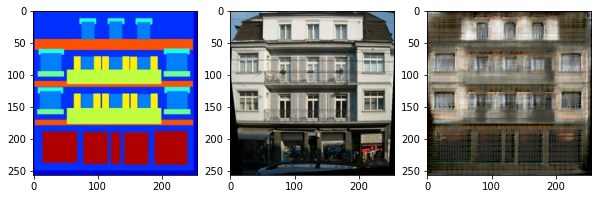

	...epoch 40/200	batch 0/100	D loss: 0.009663	G loss: 24.590370
	...epoch 40/200	batch 50/100	D loss: 0.009716	G loss: 28.639120
	...epoch 41/200	batch 0/100	D loss: 0.011362	G loss: 25.533138
	...epoch 41/200	batch 50/100	D loss: 0.003730	G loss: 29.204885
	...epoch 42/200	batch 0/100	D loss: 0.048334	G loss: 30.469765
	...epoch 42/200	batch 50/100	D loss: 0.010942	G loss: 33.618607
	...epoch 43/200	batch 0/100	D loss: 0.008624	G loss: 27.951015
	...epoch 43/200	batch 50/100	D loss: 0.031376	G loss: 28.268158
	...epoch 44/200	batch 0/100	D loss: 0.086894	G loss: 36.032921
	...epoch 44/200	batch 50/100	D loss: 0.008400	G loss: 33.444355
	...epoch 45/200	batch 0/100	D loss: 0.005015	G loss: 26.184586
	...epoch 45/200	batch 50/100	D loss: 0.014258	G loss: 32.081764
	...epoch 46/200	batch 0/100	D loss: 0.120099	G loss: 28.118267
	...epoch 46/200	batch 50/100	D loss: 0.002197	G loss: 29.295177
	...epoch 47/200	batch 0/100	D loss: 0.007240	G loss: 29.006279
	...epoch 47/200	batch 50/100	D l

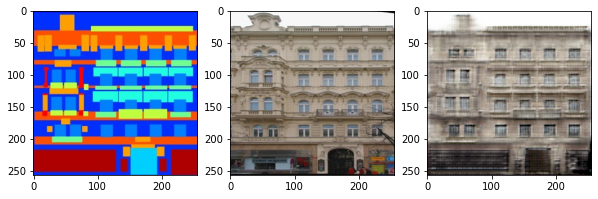

	...epoch 50/200	batch 0/100	D loss: 0.019304	G loss: 26.648123
	...epoch 50/200	batch 50/100	D loss: 0.035347	G loss: 29.548748
	...epoch 51/200	batch 0/100	D loss: 0.012075	G loss: 31.628332
	...epoch 51/200	batch 50/100	D loss: 0.068644	G loss: 32.592651
	...epoch 52/200	batch 0/100	D loss: 0.008378	G loss: 27.532890
	...epoch 52/200	batch 50/100	D loss: 0.017194	G loss: 28.705832
	...epoch 53/200	batch 0/100	D loss: 0.018945	G loss: 26.770082
	...epoch 53/200	batch 50/100	D loss: 0.008170	G loss: 30.472673
	...epoch 54/200	batch 0/100	D loss: 0.024478	G loss: 35.272392
	...epoch 54/200	batch 50/100	D loss: 0.015466	G loss: 31.624706
	...epoch 55/200	batch 0/100	D loss: 0.316353	G loss: 29.294849
	...epoch 55/200	batch 50/100	D loss: 0.035515	G loss: 30.072130
	...epoch 56/200	batch 0/100	D loss: 0.006542	G loss: 35.152161
	...epoch 56/200	batch 50/100	D loss: 0.755435	G loss: 30.219097
	...epoch 57/200	batch 0/100	D loss: 0.045530	G loss: 27.487673
	...epoch 57/200	batch 50/100	D l

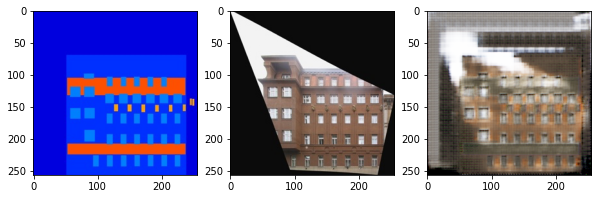

	...epoch 60/200	batch 0/100	D loss: 0.048936	G loss: 27.606857
	...epoch 60/200	batch 50/100	D loss: 0.006297	G loss: 31.070686
	...epoch 61/200	batch 0/100	D loss: 0.063242	G loss: 28.046982
	...epoch 61/200	batch 50/100	D loss: 0.000964	G loss: 27.856623
	...epoch 62/200	batch 0/100	D loss: 0.120778	G loss: 29.500959
	...epoch 62/200	batch 50/100	D loss: 0.139603	G loss: 27.264927
	...epoch 63/200	batch 0/100	D loss: 0.066752	G loss: 28.125778
	...epoch 63/200	batch 50/100	D loss: 0.007886	G loss: 32.523106
	...epoch 64/200	batch 0/100	D loss: 0.015134	G loss: 25.378180
	...epoch 64/200	batch 50/100	D loss: 0.009349	G loss: 30.665745
	...epoch 65/200	batch 0/100	D loss: 0.001949	G loss: 29.074390
	...epoch 65/200	batch 50/100	D loss: 0.015902	G loss: 30.913591
	...epoch 66/200	batch 0/100	D loss: 0.006667	G loss: 33.095066
	...epoch 66/200	batch 50/100	D loss: 0.004990	G loss: 32.010456
	...epoch 67/200	batch 0/100	D loss: 0.004625	G loss: 29.632303
	...epoch 67/200	batch 50/100	D l

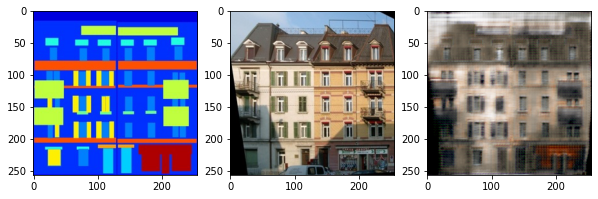

	...epoch 70/200	batch 0/100	D loss: 0.000973	G loss: 27.223507
	...epoch 70/200	batch 50/100	D loss: 0.013988	G loss: 27.537857
	...epoch 71/200	batch 0/100	D loss: 0.006271	G loss: 32.005600
	...epoch 71/200	batch 50/100	D loss: 0.017868	G loss: 31.609640
	...epoch 72/200	batch 0/100	D loss: 0.048918	G loss: 26.305851
	...epoch 72/200	batch 50/100	D loss: 0.059223	G loss: 29.748531
	...epoch 73/200	batch 0/100	D loss: 0.009444	G loss: 26.886837
	...epoch 73/200	batch 50/100	D loss: 0.118609	G loss: 27.907093
	...epoch 74/200	batch 0/100	D loss: 0.011146	G loss: 25.299820
	...epoch 74/200	batch 50/100	D loss: 0.029151	G loss: 29.670553
	...epoch 75/200	batch 0/100	D loss: 0.060564	G loss: 26.904236
	...epoch 75/200	batch 50/100	D loss: 0.031196	G loss: 27.290005
	...epoch 76/200	batch 0/100	D loss: 0.013834	G loss: 31.159271
	...epoch 76/200	batch 50/100	D loss: 0.005744	G loss: 28.397282
	...epoch 77/200	batch 0/100	D loss: 0.045844	G loss: 30.263805
	...epoch 77/200	batch 50/100	D l

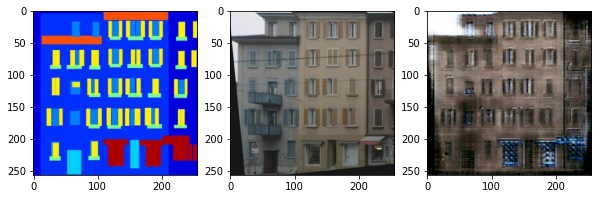

	...epoch 80/200	batch 0/100	D loss: 0.060525	G loss: 31.481667
	...epoch 80/200	batch 50/100	D loss: 0.030434	G loss: 29.662739
	...epoch 81/200	batch 0/100	D loss: 0.005767	G loss: 31.504192
	...epoch 81/200	batch 50/100	D loss: 0.004383	G loss: 29.028450
	...epoch 82/200	batch 0/100	D loss: 0.009357	G loss: 31.897697
	...epoch 82/200	batch 50/100	D loss: 0.004294	G loss: 27.670721
	...epoch 83/200	batch 0/100	D loss: 0.006687	G loss: 29.209164
	...epoch 83/200	batch 50/100	D loss: 0.004332	G loss: 34.833729
	...epoch 84/200	batch 0/100	D loss: 0.003921	G loss: 31.885181
	...epoch 84/200	batch 50/100	D loss: 0.004432	G loss: 32.009758
	...epoch 85/200	batch 0/100	D loss: 0.023186	G loss: 28.818123
	...epoch 85/200	batch 50/100	D loss: 0.001143	G loss: 23.954811
	...epoch 86/200	batch 0/100	D loss: 0.011935	G loss: 29.856712
	...epoch 86/200	batch 50/100	D loss: 0.004423	G loss: 28.757877
	...epoch 87/200	batch 0/100	D loss: 0.001556	G loss: 28.118221
	...epoch 87/200	batch 50/100	D l

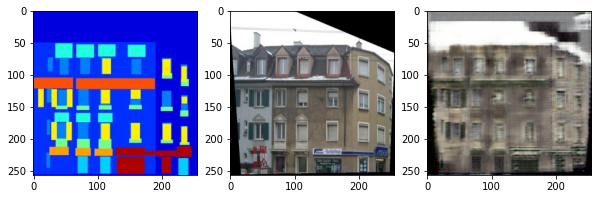

	...epoch 90/200	batch 0/100	D loss: 0.013258	G loss: 29.128223
	...epoch 90/200	batch 50/100	D loss: 0.028407	G loss: 29.663116
	...epoch 91/200	batch 0/100	D loss: 0.001476	G loss: 28.406956
	...epoch 91/200	batch 50/100	D loss: 0.036662	G loss: 27.952099
	...epoch 92/200	batch 0/100	D loss: 0.004931	G loss: 34.025879
	...epoch 92/200	batch 50/100	D loss: 0.001769	G loss: 28.632919
	...epoch 93/200	batch 0/100	D loss: 0.048241	G loss: 26.621964
	...epoch 93/200	batch 50/100	D loss: 0.001679	G loss: 28.562584
	...epoch 94/200	batch 0/100	D loss: 0.273716	G loss: 29.809170
	...epoch 94/200	batch 50/100	D loss: 0.016854	G loss: 28.486174
	...epoch 95/200	batch 0/100	D loss: 0.001405	G loss: 29.049330
	...epoch 95/200	batch 50/100	D loss: 0.001377	G loss: 30.691616
	...epoch 96/200	batch 0/100	D loss: 0.008883	G loss: 27.916409
	...epoch 96/200	batch 50/100	D loss: 0.001512	G loss: 28.871075
	...epoch 97/200	batch 0/100	D loss: 0.004138	G loss: 30.883171
	...epoch 97/200	batch 50/100	D l

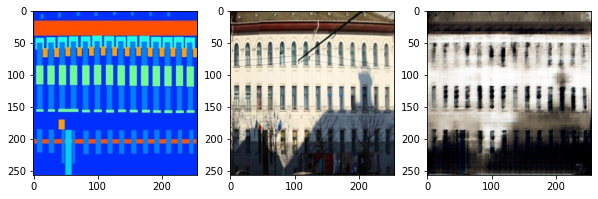

	...epoch 100/200	batch 0/100	D loss: 0.002726	G loss: 29.250626
	...epoch 100/200	batch 50/100	D loss: 0.005440	G loss: 29.784986
	...epoch 101/200	batch 0/100	D loss: 0.012304	G loss: 28.727859
	...epoch 101/200	batch 50/100	D loss: 0.018728	G loss: 28.509998
	...epoch 102/200	batch 0/100	D loss: 0.020436	G loss: 31.773827
	...epoch 102/200	batch 50/100	D loss: 0.036349	G loss: 29.973579
	...epoch 103/200	batch 0/100	D loss: 0.003663	G loss: 30.013212
	...epoch 103/200	batch 50/100	D loss: 0.073219	G loss: 33.896168
	...epoch 104/200	batch 0/100	D loss: 0.267391	G loss: 32.507202
	...epoch 104/200	batch 50/100	D loss: 0.018206	G loss: 27.200678
	...epoch 105/200	batch 0/100	D loss: 0.121999	G loss: 27.531361
	...epoch 105/200	batch 50/100	D loss: 0.016033	G loss: 31.045483
	...epoch 106/200	batch 0/100	D loss: 0.012203	G loss: 28.916222
	...epoch 106/200	batch 50/100	D loss: 0.040466	G loss: 26.252077
	...epoch 107/200	batch 0/100	D loss: 0.001056	G loss: 28.447174
	...epoch 107/200	

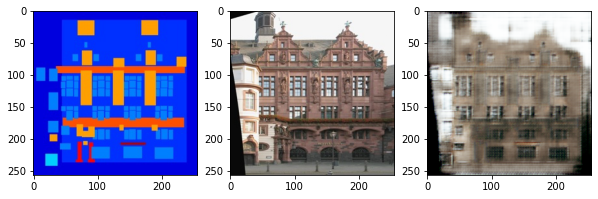

	...epoch 110/200	batch 0/100	D loss: 0.001724	G loss: 27.313524
	...epoch 110/200	batch 50/100	D loss: 0.003640	G loss: 29.461193
	...epoch 111/200	batch 0/100	D loss: 0.020202	G loss: 26.258545
	...epoch 111/200	batch 50/100	D loss: 0.004363	G loss: 30.055731
	...epoch 112/200	batch 0/100	D loss: 0.000288	G loss: 31.315823
	...epoch 112/200	batch 50/100	D loss: 0.087452	G loss: 27.719421
	...epoch 113/200	batch 0/100	D loss: 0.009975	G loss: 29.982977
	...epoch 113/200	batch 50/100	D loss: 0.043405	G loss: 28.701244
	...epoch 114/200	batch 0/100	D loss: 0.007489	G loss: 28.699818
	...epoch 114/200	batch 50/100	D loss: 0.025424	G loss: 24.221474
	...epoch 115/200	batch 0/100	D loss: 0.006777	G loss: 30.300938
	...epoch 115/200	batch 50/100	D loss: 0.069420	G loss: 28.658485
	...epoch 116/200	batch 0/100	D loss: 0.004357	G loss: 25.008184
	...epoch 116/200	batch 50/100	D loss: 0.002980	G loss: 29.736660
	...epoch 117/200	batch 0/100	D loss: 0.014260	G loss: 29.184315
	...epoch 117/200	

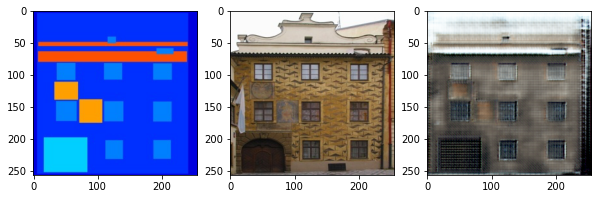

	...epoch 120/200	batch 0/100	D loss: 0.287932	G loss: 26.926243
	...epoch 120/200	batch 50/100	D loss: 0.019291	G loss: 25.672195
	...epoch 121/200	batch 0/100	D loss: 0.017563	G loss: 27.369844
	...epoch 121/200	batch 50/100	D loss: 0.130798	G loss: 27.185696
	...epoch 122/200	batch 0/100	D loss: 0.007820	G loss: 33.151928
	...epoch 122/200	batch 50/100	D loss: 0.001535	G loss: 30.822420
	...epoch 123/200	batch 0/100	D loss: 0.053631	G loss: 27.958958
	...epoch 123/200	batch 50/100	D loss: 0.070891	G loss: 27.823267
	...epoch 124/200	batch 0/100	D loss: 0.001945	G loss: 27.696529
	...epoch 124/200	batch 50/100	D loss: 0.001527	G loss: 29.944958
	...epoch 125/200	batch 0/100	D loss: 0.050746	G loss: 24.989384
	...epoch 125/200	batch 50/100	D loss: 0.011527	G loss: 27.270979
	...epoch 126/200	batch 0/100	D loss: 0.026141	G loss: 32.877838
	...epoch 126/200	batch 50/100	D loss: 0.002329	G loss: 31.925800
	...epoch 127/200	batch 0/100	D loss: 0.016070	G loss: 27.869366
	...epoch 127/200	

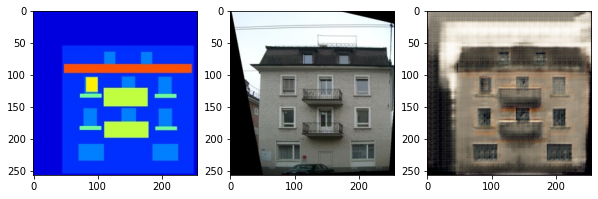

	...epoch 130/200	batch 0/100	D loss: 0.036005	G loss: 28.762962
	...epoch 130/200	batch 50/100	D loss: 0.172371	G loss: 28.540390
	...epoch 131/200	batch 0/100	D loss: 0.005575	G loss: 29.960285
	...epoch 131/200	batch 50/100	D loss: 0.001712	G loss: 27.469496
	...epoch 132/200	batch 0/100	D loss: 0.013141	G loss: 30.280233
	...epoch 132/200	batch 50/100	D loss: 0.005982	G loss: 35.074173
	...epoch 133/200	batch 0/100	D loss: 0.059615	G loss: 27.863346
	...epoch 133/200	batch 50/100	D loss: 0.441935	G loss: 32.496750
	...epoch 134/200	batch 0/100	D loss: 0.002497	G loss: 29.776615
	...epoch 134/200	batch 50/100	D loss: 0.038113	G loss: 26.638409
	...epoch 135/200	batch 0/100	D loss: 0.012753	G loss: 29.878448
	...epoch 135/200	batch 50/100	D loss: 0.012659	G loss: 27.018337
	...epoch 136/200	batch 0/100	D loss: 0.217690	G loss: 27.953619
	...epoch 136/200	batch 50/100	D loss: 0.044793	G loss: 25.193312
	...epoch 137/200	batch 0/100	D loss: 0.024522	G loss: 31.892380
	...epoch 137/200	

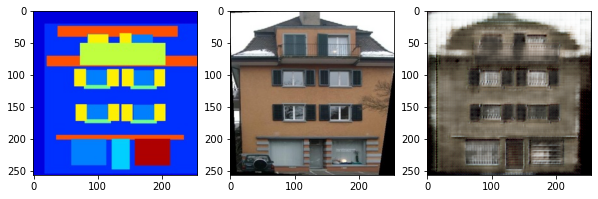

	...epoch 140/200	batch 0/100	D loss: 0.004371	G loss: 29.129450
	...epoch 140/200	batch 50/100	D loss: 0.003961	G loss: 24.869442
	...epoch 141/200	batch 0/100	D loss: 0.000755	G loss: 26.446287
	...epoch 141/200	batch 50/100	D loss: 0.012153	G loss: 28.462284
	...epoch 142/200	batch 0/100	D loss: 0.008166	G loss: 29.946815
	...epoch 142/200	batch 50/100	D loss: 0.000519	G loss: 30.516768
	...epoch 143/200	batch 0/100	D loss: 0.014761	G loss: 31.275936
	...epoch 143/200	batch 50/100	D loss: 0.031913	G loss: 28.354706
	...epoch 144/200	batch 0/100	D loss: 0.002760	G loss: 26.065443
	...epoch 144/200	batch 50/100	D loss: 0.114291	G loss: 28.789570
	...epoch 145/200	batch 0/100	D loss: 0.001016	G loss: 26.046827
	...epoch 145/200	batch 50/100	D loss: 0.001290	G loss: 29.863052
	...epoch 146/200	batch 0/100	D loss: 0.023072	G loss: 32.142784
	...epoch 146/200	batch 50/100	D loss: 0.003247	G loss: 33.798088
	...epoch 147/200	batch 0/100	D loss: 0.008782	G loss: 28.474806
	...epoch 147/200	

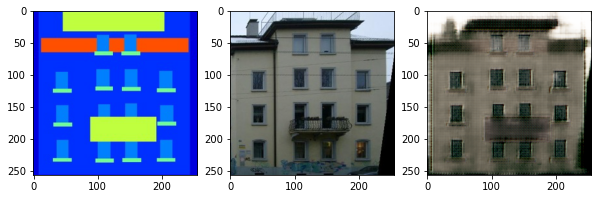

	...epoch 150/200	batch 0/100	D loss: 0.003710	G loss: 27.882484
	...epoch 150/200	batch 50/100	D loss: 0.012776	G loss: 31.769379
	...epoch 151/200	batch 0/100	D loss: 0.001145	G loss: 35.256371
	...epoch 151/200	batch 50/100	D loss: 0.002730	G loss: 27.537525
	...epoch 152/200	batch 0/100	D loss: 0.008563	G loss: 29.731428
	...epoch 152/200	batch 50/100	D loss: 0.021191	G loss: 33.751919
	...epoch 153/200	batch 0/100	D loss: 0.002735	G loss: 30.052464
	...epoch 153/200	batch 50/100	D loss: 0.002547	G loss: 26.183699
	...epoch 154/200	batch 0/100	D loss: 0.060263	G loss: 25.395338
	...epoch 154/200	batch 50/100	D loss: 0.004184	G loss: 25.971792
	...epoch 155/200	batch 0/100	D loss: 0.000562	G loss: 28.024036
	...epoch 155/200	batch 50/100	D loss: 0.009390	G loss: 30.245525
	...epoch 156/200	batch 0/100	D loss: 0.003098	G loss: 27.894810
	...epoch 156/200	batch 50/100	D loss: 0.002124	G loss: 31.363144
	...epoch 157/200	batch 0/100	D loss: 0.005735	G loss: 26.078527
	...epoch 157/200	

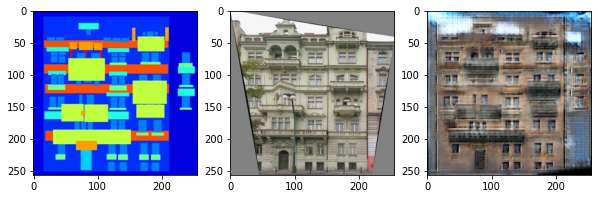

	...epoch 160/200	batch 0/100	D loss: 0.006471	G loss: 25.470028
	...epoch 160/200	batch 50/100	D loss: 0.001712	G loss: 24.429291
	...epoch 161/200	batch 0/100	D loss: 0.001237	G loss: 29.915817
	...epoch 161/200	batch 50/100	D loss: 0.339084	G loss: 30.462444
	...epoch 162/200	batch 0/100	D loss: 0.002684	G loss: 27.840956
	...epoch 162/200	batch 50/100	D loss: 0.019101	G loss: 27.090363
	...epoch 163/200	batch 0/100	D loss: 0.045912	G loss: 29.163019
	...epoch 163/200	batch 50/100	D loss: 0.005696	G loss: 29.365543
	...epoch 164/200	batch 0/100	D loss: 0.028225	G loss: 26.812977
	...epoch 164/200	batch 50/100	D loss: 0.003771	G loss: 29.994051
	...epoch 165/200	batch 0/100	D loss: 0.150256	G loss: 27.095951
	...epoch 165/200	batch 50/100	D loss: 0.003116	G loss: 27.882856
	...epoch 166/200	batch 0/100	D loss: 0.019262	G loss: 26.057276
	...epoch 166/200	batch 50/100	D loss: 0.000408	G loss: 30.044882
	...epoch 167/200	batch 0/100	D loss: 0.004031	G loss: 27.205811
	...epoch 167/200	

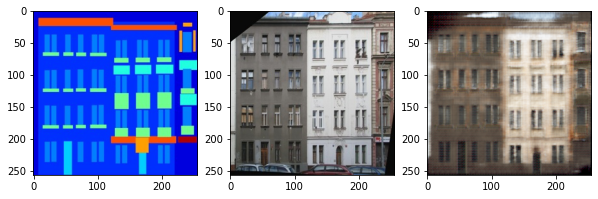

	...epoch 170/200	batch 0/100	D loss: 0.003792	G loss: 28.174938
	...epoch 170/200	batch 50/100	D loss: 0.003177	G loss: 31.747164
	...epoch 171/200	batch 0/100	D loss: 0.003476	G loss: 28.237230
	...epoch 171/200	batch 50/100	D loss: 0.002418	G loss: 27.184351
	...epoch 172/200	batch 0/100	D loss: 0.001385	G loss: 25.797434
	...epoch 172/200	batch 50/100	D loss: 0.001012	G loss: 27.898628
	...epoch 173/200	batch 0/100	D loss: 0.003685	G loss: 28.868675
	...epoch 173/200	batch 50/100	D loss: 0.004889	G loss: 28.453609
	...epoch 174/200	batch 0/100	D loss: 0.001990	G loss: 26.514832
	...epoch 174/200	batch 50/100	D loss: 0.001173	G loss: 25.654072
	...epoch 175/200	batch 0/100	D loss: 0.002386	G loss: 27.571630
	...epoch 175/200	batch 50/100	D loss: 0.001646	G loss: 30.420170
	...epoch 176/200	batch 0/100	D loss: 0.001918	G loss: 35.035198
	...epoch 176/200	batch 50/100	D loss: 0.003822	G loss: 26.550394
	...epoch 177/200	batch 0/100	D loss: 0.001498	G loss: 26.427692
	...epoch 177/200	

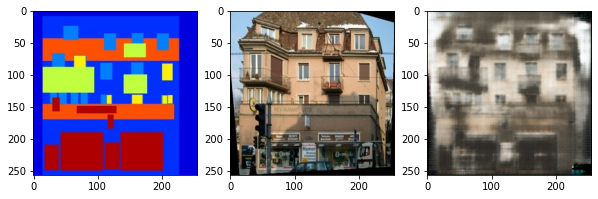

	...epoch 180/200	batch 0/100	D loss: 0.003613	G loss: 24.213835
	...epoch 180/200	batch 50/100	D loss: 0.002968	G loss: 27.168186
	...epoch 181/200	batch 0/100	D loss: 0.001307	G loss: 27.912350
	...epoch 181/200	batch 50/100	D loss: 0.001735	G loss: 28.249176
	...epoch 182/200	batch 0/100	D loss: 0.000445	G loss: 26.216187
	...epoch 182/200	batch 50/100	D loss: 0.001515	G loss: 27.361746
	...epoch 183/200	batch 0/100	D loss: 0.001539	G loss: 31.432629
	...epoch 183/200	batch 50/100	D loss: 0.002885	G loss: 26.564991
	...epoch 184/200	batch 0/100	D loss: 0.000401	G loss: 26.865135
	...epoch 184/200	batch 50/100	D loss: 0.000370	G loss: 29.738319
	...epoch 185/200	batch 0/100	D loss: 0.000891	G loss: 28.758623
	...epoch 185/200	batch 50/100	D loss: 0.001335	G loss: 26.835091
	...epoch 186/200	batch 0/100	D loss: 0.000572	G loss: 26.503883
	...epoch 186/200	batch 50/100	D loss: 0.001658	G loss: 31.786552
	...epoch 187/200	batch 0/100	D loss: 0.000873	G loss: 27.183678
	...epoch 187/200	

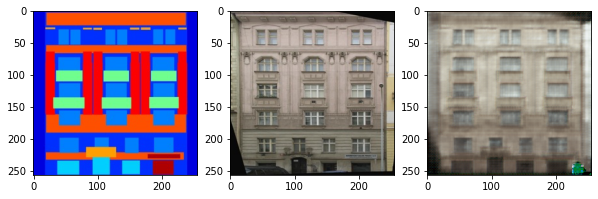

	...epoch 190/200	batch 0/100	D loss: 0.032706	G loss: 29.006865
	...epoch 190/200	batch 50/100	D loss: 0.001112	G loss: 26.773724
	...epoch 191/200	batch 0/100	D loss: 0.000892	G loss: 30.343241
	...epoch 191/200	batch 50/100	D loss: 0.024042	G loss: 26.882607
	...epoch 192/200	batch 0/100	D loss: 0.010819	G loss: 27.587509
	...epoch 192/200	batch 50/100	D loss: 0.003152	G loss: 29.043053
	...epoch 193/200	batch 0/100	D loss: 0.001021	G loss: 28.377262
	...epoch 193/200	batch 50/100	D loss: 0.000497	G loss: 25.643940
	...epoch 194/200	batch 0/100	D loss: 0.000937	G loss: 28.920303
	...epoch 194/200	batch 50/100	D loss: 0.000383	G loss: 31.429451
	...epoch 195/200	batch 0/100	D loss: 0.000951	G loss: 30.193602
	...epoch 195/200	batch 50/100	D loss: 0.000554	G loss: 28.774246
	...epoch 196/200	batch 0/100	D loss: 0.001465	G loss: 28.551443
	...epoch 196/200	batch 50/100	D loss: 0.000162	G loss: 30.305470
	...epoch 197/200	batch 0/100	D loss: 0.000274	G loss: 27.782063
	...epoch 197/200	

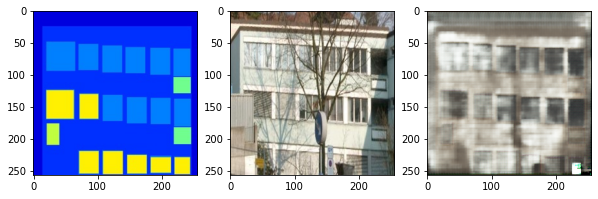

In [ ]:
d_losses, g_losses = train(num_epochs=200)

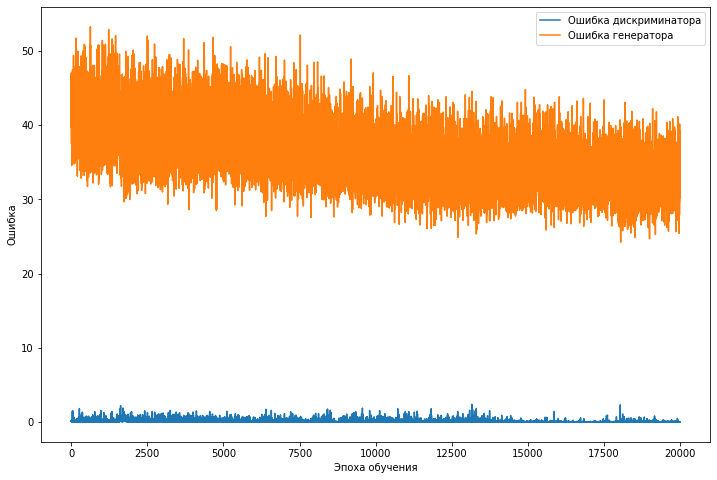

In [19]:
plot_losses(d_losses, g_losses)

In [34]:
def display_test(dataloader, model):
    for i, imgs in enumerate(dataloader):
        cond = imgs[1]
        real = imgs[0]
        with torch.no_grad():
            fake = model.generator(cond)
        
        display_progress(cond[0], fake[0], real[0])
        if i > 10:
            return

In [31]:
test_path = "./facades/test/"

In [36]:
test_dataset = FacadesDataset(test_path)
test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=True)

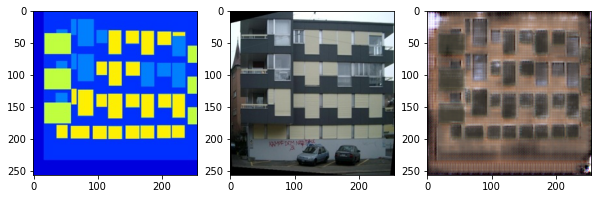

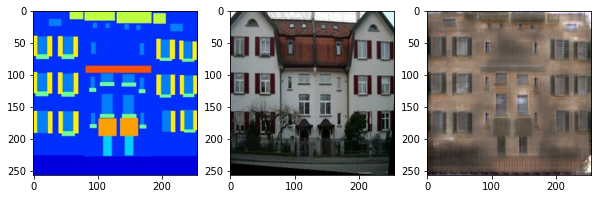

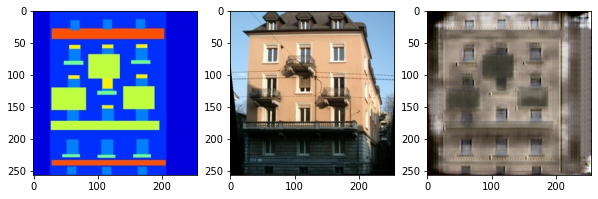

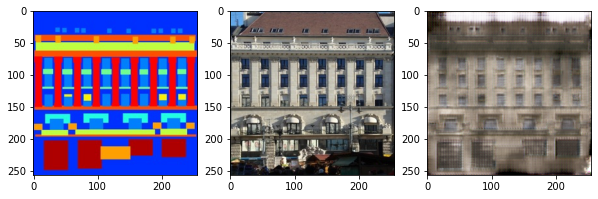

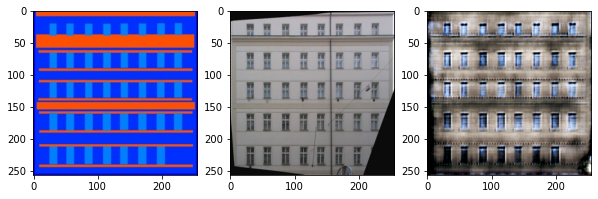

...

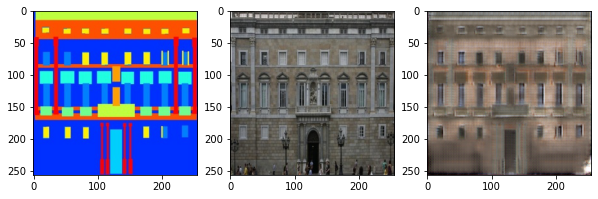

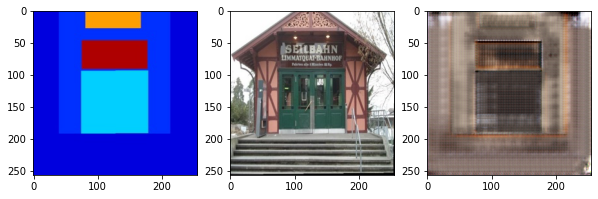

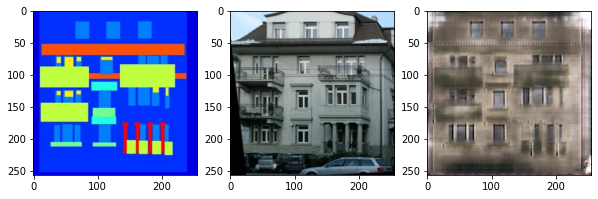

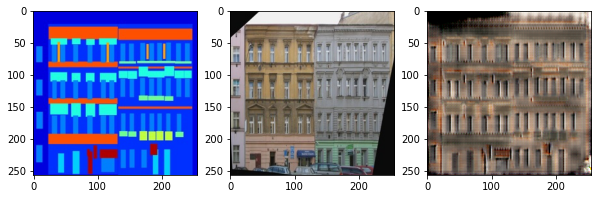

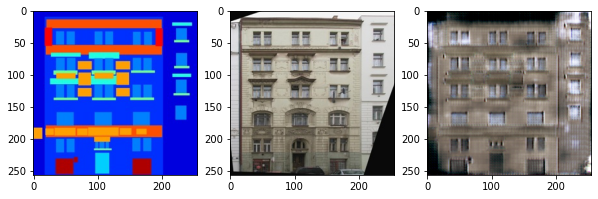

In [37]:
display_test(test_dataloader, model)

Как видим, за 400 эпох модель неплохо научилась генерировать очертания дома по заданной схеме. При этом модель не переучилась, что подтверждается на тестовой выборке (по крайней мере визуально)

# Часть II. CycleGan

Для циклического ГАНа нужен дискриминатор, который принимает на вход одну картинку, поэтому его необходимо чуть-чуть изменить.

In [48]:
class DiscriminatorC(nn.Module):
    def __init__(self, input_channels=3, out_channels=512, kernel=4, strides=2, padding=1):
        super().__init__()
        self.discriminator = nn.Sequential(
            nn.Conv2d(input_channels, 64, kernel, strides, padding),
            nn.Dropout2d(0.5),
            nn.ReLU(),
            
            nn.Conv2d(64, 128, kernel, strides, padding),
            nn.BatchNorm2d(128),
            nn.Dropout2d(0.5),
            nn.ReLU(),
            
            nn.Conv2d(128, 256, kernel, strides, padding),
            nn.BatchNorm2d(256),
            nn.Dropout2d(0.5),
            nn.ReLU(),
            
            nn.Conv2d(256, out_channels, kernel, strides, padding),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
            
            nn.Conv2d(out_channels, 1, kernel_size=1),
        )

    def forward(self, x):
        return self.discriminator(x)

Ниже код модели цилического ГАНа. После нескольких экспериментов я добавил веса лоссу дискриминатора, который отличает за распознавание реальных картинок. Он для нас важнее, чем дискриминатор схем, но строгой математики, конечно, за этим шагом не стоит.

In [68]:
class CycleGan(nn.Module):
    def __init__(self, in_channels=3, out_channels=3, lr=0.0002, beta1=0.5, beta2=0.999, lambda_cond=10, lambda_real=10, lambda_disc=10, display_step=1000):
        super().__init__()

        self.display_step = display_step
        self.gen_real_to_cond = Generator(in_channels, out_channels)
        self.gen_cond_to_real = Generator(in_channels, out_channels)
        
        self.disc_cond = DiscriminatorC(in_channels)
        self.disc_real = DiscriminatorC(in_channels)

        self.lambda_cond = lambda_cond
        self.lambda_real = lambda_real
        self.lambda_disc = lambda_disc

        self.gen_optimizer = torch.optim.Adam(itertools.chain(self.gen_real_to_cond.parameters(), self.gen_cond_to_real.parameters()), lr=lr, betas=(beta1, beta2))
        self.disc_optimizer = torch.optim.Adam(itertools.chain(self.disc_cond.parameters(), self.disc_real.parameters()), lr=lr, betas=(beta1, beta2))
        
        self.criterionGAN = nn.BCEWithLogitsLoss()
        self.criterionCycle = torch.nn.L1Loss()

        self.num_iters = 0

    def backward_gen(self):
        cycle_loss_1 = self.criterionCycle(self.rec_1, self.real)
        cycle_loss_2 = self.criterionCycle(self.fake_cond_2, self.condition)

        disc_logits_cond = self.disc_cond(self.fake_cond_1)
        disc_logits_real = self.disc_real(self.rec_2)

        gan_loss_cond = self.criterionGAN(disc_logits_cond, torch.ones_like(disc_logits_cond)) * self.lambda_cond
        gan_loss_real = self.criterionGAN(disc_logits_real, torch.ones_like(disc_logits_real)) * self.lambda_real

        generator_loss = gan_loss_cond + gan_loss_real + cycle_loss_1 + cycle_loss_2
        generator_loss.backward()
        return generator_loss

    def backward_disc(self, gen, disc, real_images, conditioned_images):
        fake_images = gen(conditioned_images).detach()
        fake_logits = disc(fake_images)
        real_logits = disc(real_images)

        fake_loss = self.criterionGAN(fake_logits, torch.zeros_like(fake_logits))
        real_loss = self.criterionGAN(real_logits, torch.ones_like(real_logits))
        discriminator_loss = (fake_loss + real_loss) / 2
        discriminator_loss.backward()
        return discriminator_loss

    def train_step(self, batch):
        self.real, self.condition = batch

        self.fake_cond_1 = self.gen_real_to_cond(self.real)
        self.rec_1 = self.gen_cond_to_real(self.fake_cond_1)
        
        self.rec_2 = self.gen_cond_to_real(self.condition)
        self.fake_cond_2 = self.gen_real_to_cond(self.rec_2)

        # generator step
        self.gen_optimizer.zero_grad()
        generator_loss = self.backward_gen()
        self.gen_optimizer.step()

        # discriminator step
        self.disc_optimizer.zero_grad()
        disc_real_loss = self.backward_disc(self.gen_cond_to_real, self.disc_real, self.real, self.condition) * self.lambda_disc
        disc_cond_loss = self.backward_disc(self.gen_real_to_cond, self.disc_cond, self.condition, self.real)
        discriminator_loss = disc_real_loss + disc_cond_loss
        self.disc_optimizer.step()

        self.num_iters += 1
        if self.num_iters % self.display_step == 0:
            fake = self.gen_cond_to_real(self.condition).detach()
            display_progress(self.condition[0], fake[0], self.real[0])
        
        return discriminator_loss, generator_loss

In [69]:
model_cycle = CycleGan(display_step=500).to(device)

	...epoch 0/100	batch 0/100	D loss: 72.086594	G loss: 59.762764
	...epoch 0/100	batch 50/100	D loss: 46.074142	G loss: 65.900398
	...epoch 1/100	batch 0/100	D loss: 48.782631	G loss: 64.369736
	...epoch 1/100	batch 50/100	D loss: 61.703018	G loss: 65.394569
	...epoch 2/100	batch 0/100	D loss: 68.933662	G loss: 66.064766
	...epoch 2/100	batch 50/100	D loss: 56.027748	G loss: 43.632622
	...epoch 3/100	batch 0/100	D loss: 52.835178	G loss: 72.707375


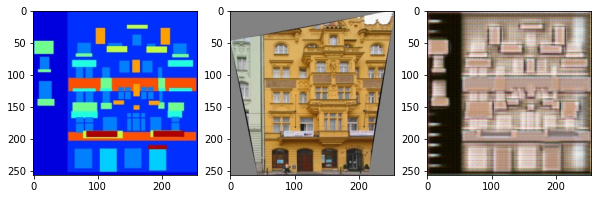

	...epoch 3/100	batch 50/100	D loss: 43.992680	G loss: 78.533371
	...epoch 4/100	batch 0/100	D loss: 53.276295	G loss: 58.231895
	...epoch 4/100	batch 50/100	D loss: 52.412041	G loss: 56.763855
	...epoch 5/100	batch 0/100	D loss: 58.377934	G loss: 62.458710
	...epoch 5/100	batch 50/100	D loss: 54.761204	G loss: 83.778084
	...epoch 6/100	batch 0/100	D loss: 54.626175	G loss: 72.860580
	...epoch 6/100	batch 50/100	D loss: 39.292862	G loss: 75.371986
	...epoch 7/100	batch 0/100	D loss: 53.246113	G loss: 80.887474
	...epoch 7/100	batch 50/100	D loss: 59.342564	G loss: 49.265385
	...epoch 8/100	batch 0/100	D loss: 85.216034	G loss: 76.071358


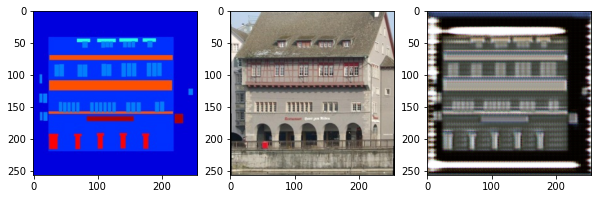

	...epoch 8/100	batch 50/100	D loss: 50.572727	G loss: 57.871716
	...epoch 9/100	batch 0/100	D loss: 60.605434	G loss: 67.768776
	...epoch 9/100	batch 50/100	D loss: 63.915249	G loss: 71.157555
	...epoch 10/100	batch 0/100	D loss: 45.685081	G loss: 56.687202
	...epoch 10/100	batch 50/100	D loss: 77.742920	G loss: 70.869644
	...epoch 11/100	batch 0/100	D loss: 38.817749	G loss: 80.328842
	...epoch 11/100	batch 50/100	D loss: 50.740471	G loss: 60.953865
	...epoch 12/100	batch 0/100	D loss: 73.721863	G loss: 78.373672
	...epoch 12/100	batch 50/100	D loss: 50.128021	G loss: 74.599602
	...epoch 13/100	batch 0/100	D loss: 50.648666	G loss: 69.828270


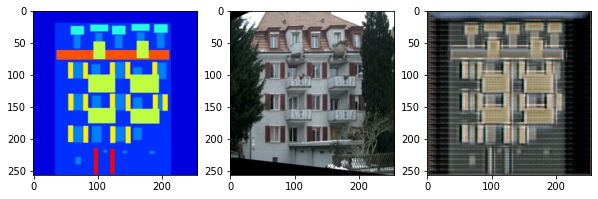

	...epoch 13/100	batch 50/100	D loss: 66.123962	G loss: 82.358482
	...epoch 14/100	batch 0/100	D loss: 44.529560	G loss: 63.308380
	...epoch 14/100	batch 50/100	D loss: 41.429935	G loss: 73.140930
	...epoch 15/100	batch 0/100	D loss: 71.273994	G loss: 60.387650
	...epoch 15/100	batch 50/100	D loss: 69.052628	G loss: 50.798935
	...epoch 16/100	batch 0/100	D loss: 75.985214	G loss: 57.480709
	...epoch 16/100	batch 50/100	D loss: 55.336540	G loss: 84.179451
	...epoch 17/100	batch 0/100	D loss: 45.293274	G loss: 71.939293
	...epoch 17/100	batch 50/100	D loss: 51.077042	G loss: 85.293091
	...epoch 18/100	batch 0/100	D loss: 63.725651	G loss: 81.025406


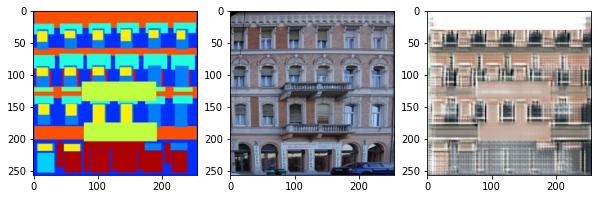

	...epoch 18/100	batch 50/100	D loss: 51.416435	G loss: 90.710060
	...epoch 19/100	batch 0/100	D loss: 84.830444	G loss: 92.948151
	...epoch 19/100	batch 50/100	D loss: 57.094280	G loss: 78.154716
	...epoch 20/100	batch 0/100	D loss: 44.527405	G loss: 88.437485
	...epoch 20/100	batch 50/100	D loss: 66.025101	G loss: 91.964081
	...epoch 21/100	batch 0/100	D loss: 29.519623	G loss: 87.334694
	...epoch 21/100	batch 50/100	D loss: 72.427010	G loss: 95.625336
	...epoch 22/100	batch 0/100	D loss: 34.030720	G loss: 90.497650
	...epoch 22/100	batch 50/100	D loss: 63.523090	G loss: 73.620865
	...epoch 23/100	batch 0/100	D loss: 77.460480	G loss: 62.059040


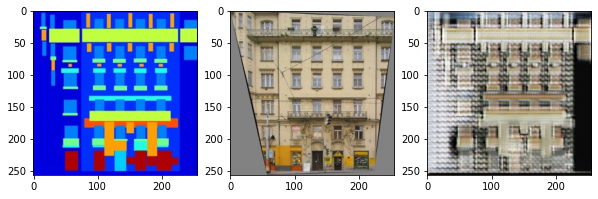

	...epoch 23/100	batch 50/100	D loss: 82.012131	G loss: 54.938187
	...epoch 24/100	batch 0/100	D loss: 38.198978	G loss: 75.230621
	...epoch 24/100	batch 50/100	D loss: 66.145332	G loss: 79.846939
	...epoch 25/100	batch 0/100	D loss: 49.808006	G loss: 86.893639
	...epoch 25/100	batch 50/100	D loss: 104.055954	G loss: 86.794106
	...epoch 26/100	batch 0/100	D loss: 123.583939	G loss: 74.080193
	...epoch 26/100	batch 50/100	D loss: 43.281410	G loss: 87.695091
	...epoch 27/100	batch 0/100	D loss: 58.933472	G loss: 93.586876
	...epoch 27/100	batch 50/100	D loss: 53.029491	G loss: 92.126389
	...epoch 28/100	batch 0/100	D loss: 78.948395	G loss: 87.610962


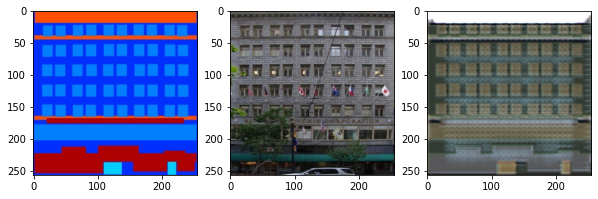

	...epoch 28/100	batch 50/100	D loss: 38.755466	G loss: 48.382038
	...epoch 29/100	batch 0/100	D loss: 38.761982	G loss: 78.546242
	...epoch 29/100	batch 50/100	D loss: 38.443142	G loss: 93.220001
	...epoch 30/100	batch 0/100	D loss: 50.014839	G loss: 103.667183
	...epoch 30/100	batch 50/100	D loss: 68.937294	G loss: 92.816559
	...epoch 31/100	batch 0/100	D loss: 71.178810	G loss: 97.088234
	...epoch 31/100	batch 50/100	D loss: 71.497643	G loss: 95.943398
	...epoch 32/100	batch 0/100	D loss: 36.279400	G loss: 94.746193
	...epoch 32/100	batch 50/100	D loss: 56.003685	G loss: 73.407455
	...epoch 33/100	batch 0/100	D loss: 32.236031	G loss: 73.032867


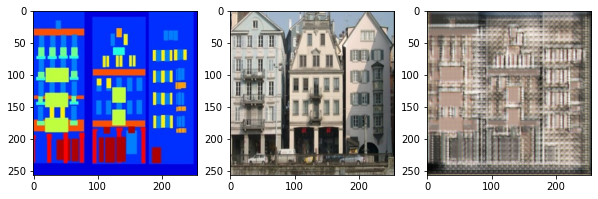

	...epoch 33/100	batch 50/100	D loss: 89.572998	G loss: 65.535881
	...epoch 34/100	batch 0/100	D loss: 38.847370	G loss: 72.617546
	...epoch 34/100	batch 50/100	D loss: 62.468521	G loss: 85.809387
	...epoch 35/100	batch 0/100	D loss: 49.951725	G loss: 98.014114
	...epoch 35/100	batch 50/100	D loss: 41.938919	G loss: 88.305580
	...epoch 36/100	batch 0/100	D loss: 51.387676	G loss: 96.668747
	...epoch 36/100	batch 50/100	D loss: 64.541954	G loss: 98.249580
	...epoch 37/100	batch 0/100	D loss: 24.934723	G loss: 85.897469
	...epoch 37/100	batch 50/100	D loss: 69.964493	G loss: 87.725891
	...epoch 38/100	batch 0/100	D loss: 42.411697	G loss: 81.273781


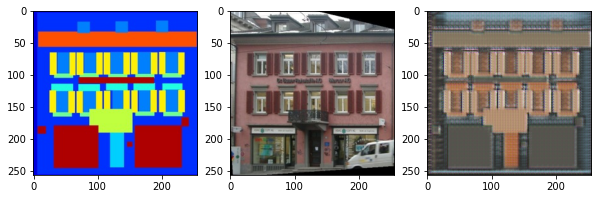

	...epoch 38/100	batch 50/100	D loss: 43.652596	G loss: 103.938637
	...epoch 39/100	batch 0/100	D loss: 41.083267	G loss: 101.658562
	...epoch 39/100	batch 50/100	D loss: 74.341042	G loss: 100.958366
	...epoch 40/100	batch 0/100	D loss: 63.822433	G loss: 99.017479
	...epoch 40/100	batch 50/100	D loss: 40.211021	G loss: 58.461823
	...epoch 41/100	batch 0/100	D loss: 29.657270	G loss: 80.559647
	...epoch 41/100	batch 50/100	D loss: 37.912163	G loss: 88.460449
	...epoch 42/100	batch 0/100	D loss: 46.584263	G loss: 90.437202
	...epoch 42/100	batch 50/100	D loss: 41.449524	G loss: 86.183998
	...epoch 43/100	batch 0/100	D loss: 53.286991	G loss: 88.090042


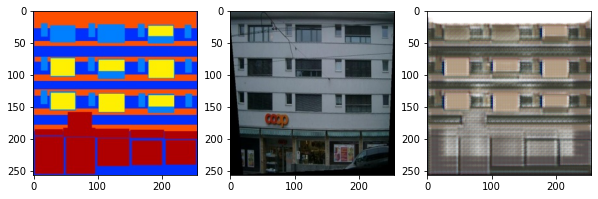

	...epoch 43/100	batch 50/100	D loss: 58.921337	G loss: 85.750114
	...epoch 44/100	batch 0/100	D loss: 49.035652	G loss: 105.292122
	...epoch 44/100	batch 50/100	D loss: 52.519978	G loss: 100.713341
	...epoch 45/100	batch 0/100	D loss: 35.126694	G loss: 72.035988
	...epoch 45/100	batch 50/100	D loss: 77.164047	G loss: 92.648521
	...epoch 46/100	batch 0/100	D loss: 67.349525	G loss: 83.177200
	...epoch 46/100	batch 50/100	D loss: 109.578209	G loss: 100.228104
	...epoch 47/100	batch 0/100	D loss: 49.976643	G loss: 86.719345
	...epoch 47/100	batch 50/100	D loss: 53.151173	G loss: 68.464371
	...epoch 48/100	batch 0/100	D loss: 45.493843	G loss: 101.952896


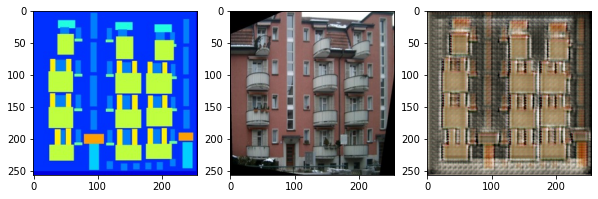

	...epoch 48/100	batch 50/100	D loss: 41.364376	G loss: 68.147659
	...epoch 49/100	batch 0/100	D loss: 33.437260	G loss: 68.619392
	...epoch 49/100	batch 50/100	D loss: 39.269535	G loss: 51.583965
	...epoch 50/100	batch 0/100	D loss: 69.339890	G loss: 22.217062
	...epoch 50/100	batch 50/100	D loss: 68.614967	G loss: 48.702713
	...epoch 51/100	batch 0/100	D loss: 47.405220	G loss: 37.581444
	...epoch 51/100	batch 50/100	D loss: 87.402420	G loss: 52.290493
	...epoch 52/100	batch 0/100	D loss: 46.705463	G loss: 52.313496
	...epoch 52/100	batch 50/100	D loss: 53.342323	G loss: 48.182987
	...epoch 53/100	batch 0/100	D loss: 60.159817	G loss: 48.722595


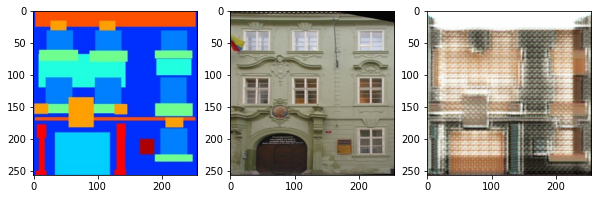

	...epoch 53/100	batch 50/100	D loss: 84.194679	G loss: 42.572285
	...epoch 54/100	batch 0/100	D loss: 40.931458	G loss: 35.074947
	...epoch 54/100	batch 50/100	D loss: 112.432419	G loss: 66.925064
	...epoch 55/100	batch 0/100	D loss: 97.202286	G loss: 45.283066
	...epoch 55/100	batch 50/100	D loss: 40.474384	G loss: 59.313343
	...epoch 56/100	batch 0/100	D loss: 49.010574	G loss: 57.661610
	...epoch 56/100	batch 50/100	D loss: 40.313412	G loss: 38.801777
	...epoch 57/100	batch 0/100	D loss: 33.511036	G loss: 39.579659
	...epoch 57/100	batch 50/100	D loss: 74.714531	G loss: 47.618412
	...epoch 58/100	batch 0/100	D loss: 19.964489	G loss: 47.332703


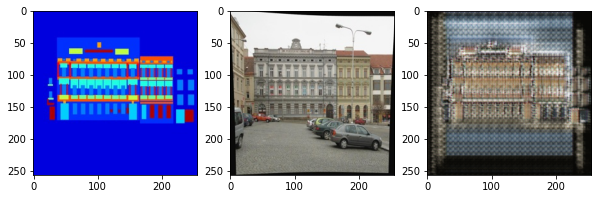

	...epoch 58/100	batch 50/100	D loss: 68.720634	G loss: 47.044872
	...epoch 59/100	batch 0/100	D loss: 63.984550	G loss: 28.825548
	...epoch 59/100	batch 50/100	D loss: 68.987175	G loss: 34.714508
	...epoch 60/100	batch 0/100	D loss: 72.010086	G loss: 57.652470
	...epoch 60/100	batch 50/100	D loss: 37.848164	G loss: 57.863953
	...epoch 61/100	batch 0/100	D loss: 107.741043	G loss: 42.232128
	...epoch 61/100	batch 50/100	D loss: 49.491669	G loss: 54.753490
	...epoch 62/100	batch 0/100	D loss: 48.255829	G loss: 89.403358
	...epoch 62/100	batch 50/100	D loss: 44.350834	G loss: 25.524429
	...epoch 63/100	batch 0/100	D loss: 84.241051	G loss: 14.695768


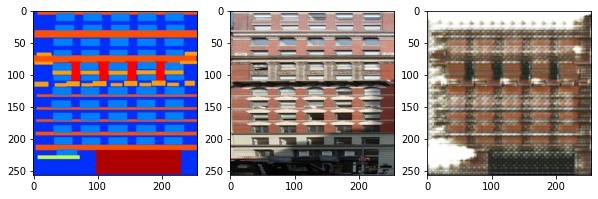

	...epoch 63/100	batch 50/100	D loss: 46.809048	G loss: 23.559061
	...epoch 64/100	batch 0/100	D loss: 77.078995	G loss: 60.144669
	...epoch 64/100	batch 50/100	D loss: 44.648418	G loss: 70.229660
	...epoch 65/100	batch 0/100	D loss: 50.691925	G loss: 51.884727
	...epoch 65/100	batch 50/100	D loss: 49.134651	G loss: 40.241390
	...epoch 66/100	batch 0/100	D loss: 40.582485	G loss: 76.731384
	...epoch 66/100	batch 50/100	D loss: 55.341267	G loss: 65.809845
	...epoch 67/100	batch 0/100	D loss: 60.726482	G loss: 72.754837
	...epoch 67/100	batch 50/100	D loss: 68.240051	G loss: 72.385124
	...epoch 68/100	batch 0/100	D loss: 77.877136	G loss: 64.969826


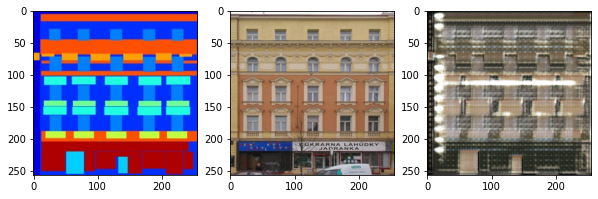

	...epoch 68/100	batch 50/100	D loss: 34.961227	G loss: 77.290459
	...epoch 69/100	batch 0/100	D loss: 37.630821	G loss: 85.700615
	...epoch 69/100	batch 50/100	D loss: 97.327141	G loss: 68.567581
	...epoch 70/100	batch 0/100	D loss: 61.396603	G loss: 74.297066
	...epoch 70/100	batch 50/100	D loss: 71.453651	G loss: 84.224762
	...epoch 71/100	batch 0/100	D loss: 41.097630	G loss: 85.780701
	...epoch 71/100	batch 50/100	D loss: 29.745775	G loss: 67.559425
	...epoch 72/100	batch 0/100	D loss: 55.591026	G loss: 77.022270
	...epoch 72/100	batch 50/100	D loss: 36.170616	G loss: 68.334831
	...epoch 73/100	batch 0/100	D loss: 44.397018	G loss: 71.799316


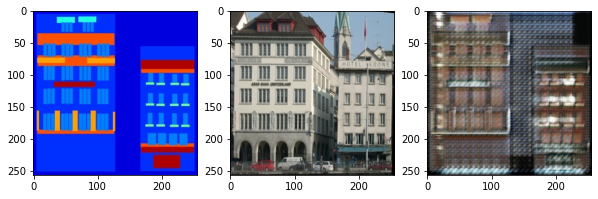

	...epoch 73/100	batch 50/100	D loss: 45.266785	G loss: 79.961395
	...epoch 74/100	batch 0/100	D loss: 20.518810	G loss: 76.732933
	...epoch 74/100	batch 50/100	D loss: 51.206459	G loss: 81.786713
	...epoch 75/100	batch 0/100	D loss: 51.905510	G loss: 54.406406
	...epoch 75/100	batch 50/100	D loss: 53.492100	G loss: 82.178726
	...epoch 76/100	batch 0/100	D loss: 34.116413	G loss: 18.967577
	...epoch 76/100	batch 50/100	D loss: 63.595310	G loss: 48.893047
	...epoch 77/100	batch 0/100	D loss: 44.675343	G loss: 24.840654
	...epoch 77/100	batch 50/100	D loss: 78.754501	G loss: 47.314289
	...epoch 78/100	batch 0/100	D loss: 50.686359	G loss: 50.770855


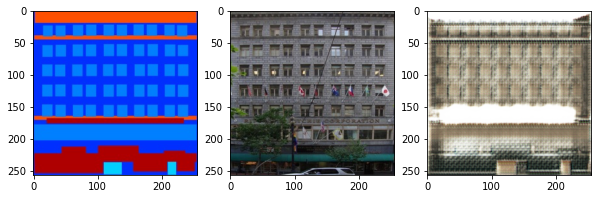

	...epoch 78/100	batch 50/100	D loss: 79.836235	G loss: 34.323616
	...epoch 79/100	batch 0/100	D loss: 74.512756	G loss: 67.550987
	...epoch 79/100	batch 50/100	D loss: 81.627495	G loss: 60.912445
	...epoch 80/100	batch 0/100	D loss: 66.731682	G loss: 76.764671
	...epoch 80/100	batch 50/100	D loss: 77.807198	G loss: 70.653664
	...epoch 81/100	batch 0/100	D loss: 40.047379	G loss: 60.018894
	...epoch 81/100	batch 50/100	D loss: 60.080154	G loss: 46.436375
	...epoch 82/100	batch 0/100	D loss: 50.099514	G loss: 66.836983
	...epoch 82/100	batch 50/100	D loss: 32.218864	G loss: 65.962982
	...epoch 83/100	batch 0/100	D loss: 37.695965	G loss: 44.754910


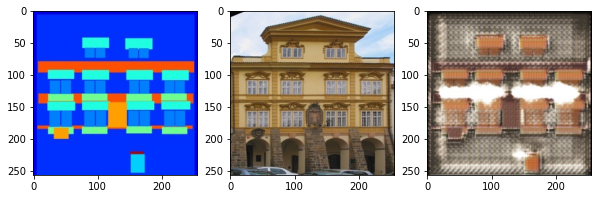

	...epoch 83/100	batch 50/100	D loss: 47.454048	G loss: 73.235687
	...epoch 84/100	batch 0/100	D loss: 29.945320	G loss: 83.537453
	...epoch 84/100	batch 50/100	D loss: 44.856354	G loss: 85.119354
	...epoch 85/100	batch 0/100	D loss: 35.472553	G loss: 56.187241
	...epoch 85/100	batch 50/100	D loss: 60.472340	G loss: 85.016876
	...epoch 86/100	batch 0/100	D loss: 29.447823	G loss: 37.909012
	...epoch 86/100	batch 50/100	D loss: 72.825485	G loss: 44.350498
	...epoch 87/100	batch 0/100	D loss: 93.575439	G loss: 39.217796
	...epoch 87/100	batch 50/100	D loss: 40.295322	G loss: 45.956909
	...epoch 88/100	batch 0/100	D loss: 25.774445	G loss: 63.816383


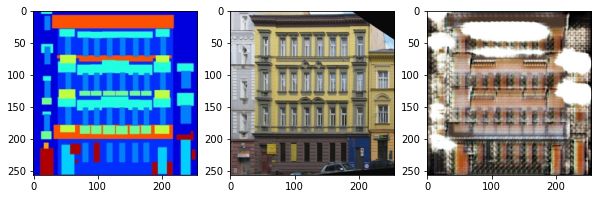

	...epoch 88/100	batch 50/100	D loss: 34.635075	G loss: 56.958366
	...epoch 89/100	batch 0/100	D loss: 28.174463	G loss: 62.686348
	...epoch 89/100	batch 50/100	D loss: 86.258133	G loss: 73.300423
	...epoch 90/100	batch 0/100	D loss: 38.082310	G loss: 69.990959
	...epoch 90/100	batch 50/100	D loss: 101.517464	G loss: 48.433674
	...epoch 91/100	batch 0/100	D loss: 63.700260	G loss: 47.886906
	...epoch 91/100	batch 50/100	D loss: 31.097418	G loss: 42.945133
	...epoch 92/100	batch 0/100	D loss: 39.931988	G loss: 69.026184
	...epoch 92/100	batch 50/100	D loss: 72.686569	G loss: 53.933338
	...epoch 93/100	batch 0/100	D loss: 82.516724	G loss: 76.625542


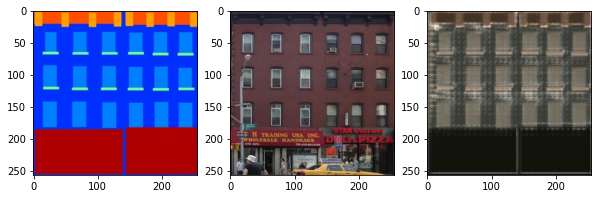

	...epoch 93/100	batch 50/100	D loss: 40.174015	G loss: 68.307838
	...epoch 94/100	batch 0/100	D loss: 69.767845	G loss: 54.746487
	...epoch 94/100	batch 50/100	D loss: 75.428627	G loss: 31.402061
	...epoch 95/100	batch 0/100	D loss: 88.939354	G loss: 70.867157
	...epoch 95/100	batch 50/100	D loss: 56.503353	G loss: 45.041824
	...epoch 96/100	batch 0/100	D loss: 52.753754	G loss: 65.015121
	...epoch 96/100	batch 50/100	D loss: 30.041523	G loss: 66.471886
	...epoch 97/100	batch 0/100	D loss: 39.984600	G loss: 59.365952
	...epoch 97/100	batch 50/100	D loss: 59.792912	G loss: 31.306787
	...epoch 98/100	batch 0/100	D loss: 55.162598	G loss: 24.485935


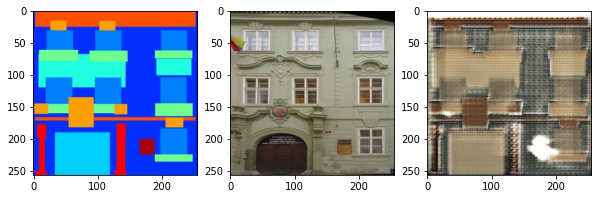

	...epoch 98/100	batch 50/100	D loss: 25.766369	G loss: 51.669941
	...epoch 99/100	batch 0/100	D loss: 54.156174	G loss: 47.378433
	...epoch 99/100	batch 50/100	D loss: 22.616076	G loss: 65.479263


In [72]:
d_losses, g_losses = train(model=model_cycle, num_epochs=100)

In [75]:
def display_test_cycle(dataloader, model):
    for i, imgs in enumerate(dataloader):
        cond = imgs[1]
        real = imgs[0]
        with torch.no_grad():
            fake = model.gen_cond_to_real(cond)
        
        display_progress(cond[0], fake[0], real[0])
        if i > 10:
            return

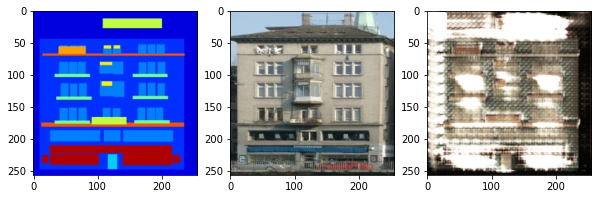

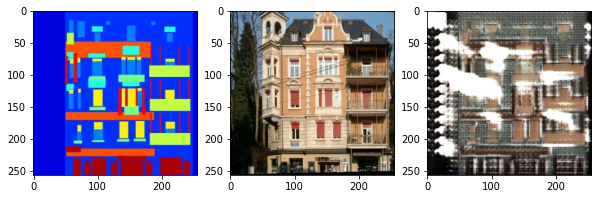

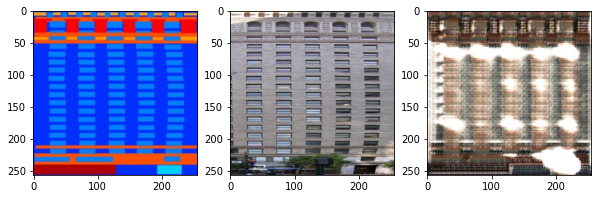

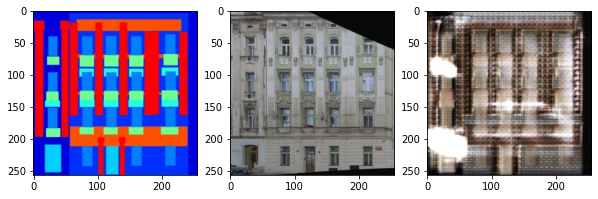

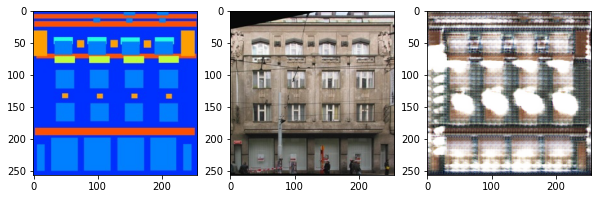

...

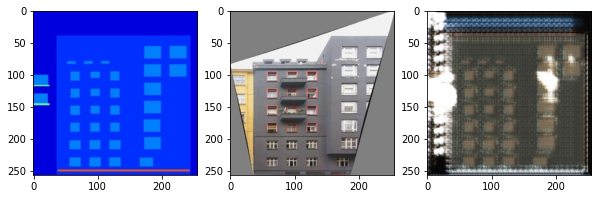

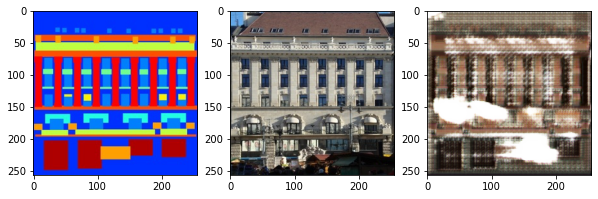

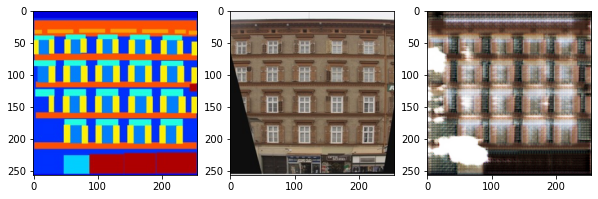

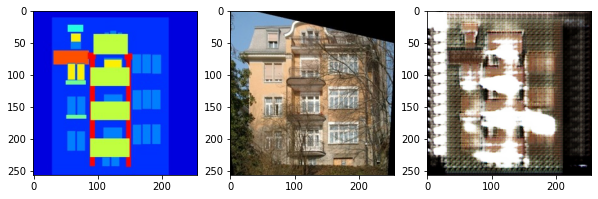

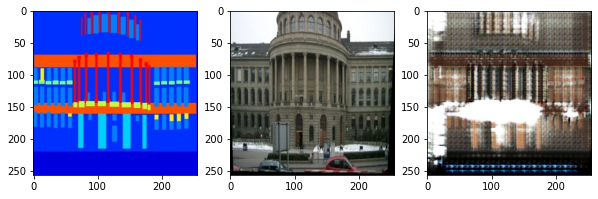

In [77]:
display_test_cycle(test_dataloader, model_cycle)

После 100 эпох качество удовлетворительное, хотя и значительно хуже обычного условного ГАНа. К сожалению, учитывая время обучения циклического гана, улучшить полученный результат не удалось